# Mammo-Bench preprocessing for a controlled Mammo-FM comparison

**Project:** Q-INTERVAL-Lite+  |  **Author:** Pasindu Pahasara (104348348)

Prepares two matched training variants from the Mammo-Bench collection - a **baseline**
and a **CLAHE** candidate - plus lossless cropped masters, a full manifest and a QA
report. No model is trained here.

Paths, metadata schema, label mapping, patient keys and the crop detector were read out
of `MammoFM_MammoBench_ThreeClass_Colab.ipynb`. That notebook is not modified and is not
imported; this one runs top to bottom from a fresh runtime on its own.

**Order of work.** Mount Drive, copy the archive locally, extract locally, audit, preview
on training images only, process everything locally, validate, package, copy to a new
Drive folder, verify the copy. Every image read and write happens under `/content`. The
original collection is never written to.

| section | what it does |
|---|---|
| 1 | configuration and setup |
| 2 | local dataset staging |
| 3 | metadata and image audit |
| 4 | preprocessing functions |
| 5 | training-only preview and checks |
| 6 | complete dataset processing |
| 7 | output validation |
| 8 | packaging and Drive export |

**How to run.** Run every cell in order with `PREVIEW_ONLY = True`. Section 5 stops the
notebook after the preview. Look at the crop boundaries and the review cases, adjust the
crop settings in section 1 if needed, then set `PREVIEW_ONLY = False` and run from the
top. The full run has no image-count limit.

## 1. Configuration and setup

In [ ]:
import os, io, sys, json, time, math, shutil, hashlib, zipfile, tarfile, platform
import subprocess, random, tempfile, traceback
from concurrent.futures import ThreadPoolExecutor, as_completed
import numpy as np, pandas as pd, cv2
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from PIL import Image
from tqdm.notebook import tqdm
from google.colab import drive

drive.mount('/content/drive')

# ==========================  EDIT THIS CELL - NOTHING ELSE  ==========================
# Paths taken from MammoFM_MammoBench_ThreeClass_Colab.ipynb. Verified against that
# file, not remembered. Anything you must supply yourself is marked USER.
DRIVE_ROOT   = '/content/drive/MyDrive/mamobench-dataset'
ZIP_PATH     = f'{DRIVE_ROOT}/dataset.zip'              # source archive
META_REL     = 'dataset/metadata.csv'                   # inside the archive
SPLIT_PATH   = f'{DRIVE_ROOT}/sprint4_audit/frozen_split.json'   # patient split manifest
AUX_SPLIT_DIR = f'{DRIVE_ROOT}/runs_allsources'         # calibration / new-patient files
                                                        # written by the training notebook

LOCAL_ROOT   = '/content/mammo_preprocess'              # all work happens here
PREP_VERSION = 'prep-v1'
DRIVE_EXPORT = f'{DRIVE_ROOT}/preprocessed_{PREP_VERSION}'   # new folder, never the source

TARGET_H, TARGET_W = 1520, 912
MAKE_MASTERS  = True        # lossless cropped masters at original depth
MAKE_BASELINE = True        # variant A: resize + pad
MAKE_CLAHE    = True        # variant B: resize + CLAHE + pad
CLAHE_CLIP    = 2.0
CLAHE_GRID    = (8, 8)      # tiles ACROSS the image, not 8-pixel tiles
CROP_MARGIN_FRAC = 0.03     # starting point for inspection, not proof the crop is safe
SEED          = 42
INSPECT_FILES = ['ddsm_4921.jpg']   # shown side by side with their originals in 3.4
N_WORKERS     = max(2, (os.cpu_count() or 4))
PREVIEW_ONLY  = False        # stop after the preview; set False for the full run

# Crop detector settings, carried over from the training notebook unchanged so the two
# notebooks agree on what "conservative crop" means.
CROP_BG_PERCENTILE = 1.0
CROP_ABS_MARGIN    = 0.02
CROP_REL_FRAC      = 0.05
CROP_MIN_AREA_FRAC = 0.02
CROP_RIVAL_RATIO   = 0.50
CROP_FAINT_FACTOR  = 0.50
CROP_FAINT_TOL     = 0.005
CROP_TIGHT_FRAC    = 0.98
CROP_DETECT_MAX_SIDE = 1024   # detect on a downsample above this; box maps back to the
                              # original and the ORIGINAL pixels are cropped
CROP_ANNOT_SAT     = 0.98     # a component this close to the image maximum is a marker
CROP_ANNOT_MAX_AREA = 0.02    # ... if it is also small
DISK_SAFETY = 1.25            # headroom multiplier on the space estimate
# =====================================================================================

# TARGET_H, TARGET_W and the CLAHE settings are initial experimental choices. 1520x912
# comes from the training notebook's input contract; 2.0 / (8,8) are OpenCV's common
# starting values. Neither has been shown to be best for this collection. They are here
# so that two variants can be trained and compared under identical conditions - not
# because they are known to be optimal.

CLASSES = ['Normal', 'Benign', 'Malignant']
random.seed(SEED); np.random.seed(SEED)

STAGE_DIR   = f'{LOCAL_ROOT}/source'        # archive copy + extraction
IMG_ROOT    = f'{STAGE_DIR}/dataset'        # extracted collection
OUT_DIR     = f'{LOCAL_ROOT}/out'           # generated images
REPORT_DIR  = f'{LOCAL_ROOT}/reports'
PACK_DIR    = f'{LOCAL_ROOT}/packages'
for d in (LOCAL_ROOT, STAGE_DIR, OUT_DIR, REPORT_DIR, PACK_DIR):
    os.makedirs(d, exist_ok=True)

CONFIG = dict(
    prep_version=PREP_VERSION, target_hw=[TARGET_H, TARGET_W], seed=SEED,
    masters=MAKE_MASTERS, baseline=MAKE_BASELINE, clahe=MAKE_CLAHE,
    clahe_clip=CLAHE_CLIP, clahe_grid=list(CLAHE_GRID),
    crop=dict(margin_frac=CROP_MARGIN_FRAC, bg_percentile=CROP_BG_PERCENTILE,
              abs_margin=CROP_ABS_MARGIN, rel_frac=CROP_REL_FRAC,
              min_area_frac=CROP_MIN_AREA_FRAC, rival_ratio=CROP_RIVAL_RATIO,
              faint_factor=CROP_FAINT_FACTOR, faint_tol=CROP_FAINT_TOL,
              tight_frac=CROP_TIGHT_FRAC, detect_max_side=CROP_DETECT_MAX_SIDE,
              annot_sat=CROP_ANNOT_SAT, annot_max_area=CROP_ANNOT_MAX_AREA))
CONFIG_HASH = hashlib.sha256(json.dumps(CONFIG, sort_keys=True).encode()).hexdigest()[:12]

def sha256_file(path, chunk=1 << 22):
    h = hashlib.sha256()
    with open(path, 'rb') as fh:
        for block in iter(lambda: fh.read(chunk), b''):
            h.update(block)
    return h.hexdigest()

def write_atomic(path, writer):
    """writer(tmp_path) must produce the file. Nothing half-written is ever left behind."""
    os.makedirs(os.path.dirname(path), exist_ok=True)
    fd, tmp = tempfile.mkstemp(dir=os.path.dirname(path), suffix='.tmp')
    os.close(fd)
    try:
        writer(tmp)
        os.replace(tmp, path)
    except BaseException:
        if os.path.exists(tmp):
            os.remove(tmp)
        raise

missing = [p for p in (ZIP_PATH,) if not os.path.exists(p)]
if missing:
    parent = os.path.dirname(missing[0])
    while parent and not os.path.isdir(parent):
        parent = os.path.dirname(parent)
    raise FileNotFoundError(
        f'{missing[0]} not found.\nNearest existing directory: {parent}\n'
        f'It contains: {sorted(os.listdir(parent))[:30] if parent else []}\n'
        'Edit DRIVE_ROOT / ZIP_PATH above.')
if not os.path.exists(SPLIT_PATH):
    print(f'NOTE: no split manifest at {SPLIT_PATH}. Every image will be recorded as '
          "split='unassigned' and the preview will have no training pool to draw from.")

PKG_VERSIONS = {'python': platform.python_version(), 'numpy': np.__version__,
                'opencv': cv2.__version__, 'pandas': pd.__version__,
                'pillow': Image.__version__}
print(f'{PREP_VERSION} | config hash {CONFIG_HASH} | seed {SEED} | workers {N_WORKERS}')
print(f'target {TARGET_H}x{TARGET_W} | masters {MAKE_MASTERS} | baseline {MAKE_BASELINE} '
      f'| clahe {MAKE_CLAHE} (clip {CLAHE_CLIP}, grid {CLAHE_GRID})')
print(f'local  {LOCAL_ROOT}')
print(f'export {DRIVE_EXPORT}')
print('PREVIEW ONLY - will stop before full processing' if PREVIEW_ONLY else 'FULL RUN')
print(PKG_VERSIONS)

Mounted at /content/drive
prep-v1 | config hash dcf6f6cb878b | seed 42 | workers 2
target 1520x912 | masters True | baseline True | clahe True (clip 2.0, grid (8, 8))
local  /content/mammo_preprocess
export /content/drive/MyDrive/mamobench-dataset/preprocessed_prep-v1
FULL RUN
{'python': '3.13.15', 'numpy': '2.1.3', 'opencv': '5.0.0', 'pandas': '2.2.3', 'pillow': '11.3.0'}


## 2. Local dataset staging

The archive is copied to local disk and extracted there, so no training image is ever
read from the Drive mount one file at a time. Free space is checked against the whole
job before anything is written; the archive's member names are checked before extraction;
and the source-relative directory structure is preserved, so the same filename appearing
under two sources cannot overwrite anything.

In [ ]:
IMG_EXT = ('.png', '.jpg', '.jpeg', '.tif', '.tiff', '.bmp')

# ---- 1. inspect the archive without extracting it ----------------------------------
zip_bytes = os.path.getsize(ZIP_PATH)
with zipfile.ZipFile(ZIP_PATH) as zf:
    infos = zf.infolist()
extracted_bytes = sum(i.file_size for i in infos)
n_img_est = sum(1 for i in infos if i.filename.lower().endswith(IMG_EXT) and not i.is_dir())

# member-name safety: nothing may escape the extraction directory
def unsafe(name):
    if name.startswith('/') or name.startswith('\\') or ':' in name[:3]:
        return 'absolute path'
    parts = name.replace('\\', '/').split('/')
    if '..' in parts:
        return 'parent traversal'
    return None
bad = [(i.filename, unsafe(i.filename)) for i in infos if unsafe(i.filename)]
# a zip symlink stores its target as the file body; extracting one can redirect a write
SYMLINK = 0xA000
links = [i.filename for i in infos if (i.external_attr >> 16) & 0xF000 == SYMLINK]
if bad or links:
    raise RuntimeError(f'unsafe archive members - refusing to extract.\n'
                       f'  bad paths: {bad[:5]}\n  symlinks: {links[:5]}')

# duplicate basenames across sources are expected; the source-relative directory
# structure is preserved on extraction so they cannot overwrite one another
base_counts = pd.Series([os.path.basename(i.filename) for i in infos
                         if not i.is_dir()]).value_counts()
dupe_basenames = int((base_counts > 1).sum())

# ---- 2. does this runtime have room for the whole job? ------------------------------
px = TARGET_H * TARGET_W
n_variants = int(MAKE_BASELINE) + int(MAKE_CLAHE)
est = {
    'archive copy': zip_bytes,
    'extracted source': extracted_bytes,
    'cropped masters': extracted_bytes * 2.0 * MAKE_MASTERS,   # lossless PNG > JPEG source
    'training variants': n_img_est * px * 0.25 * n_variants,   # ~0.25 B/px after PNG
}
est['packages'] = est['cropped masters'] + est['training variants']
need = sum(est.values()) * DISK_SAFETY
free = shutil.disk_usage(LOCAL_ROOT).free
print(f'archive {zip_bytes/1e9:.2f} GB | {len(infos)} members | {n_img_est} images | '
      f'{dupe_basenames} basenames appear more than once')
for k, v in est.items():
    print(f'   {k:<20s} {v/1e9:7.2f} GB')
print(f'   {"needed x" + str(DISK_SAFETY):<20s} {need/1e9:7.2f} GB      free {free/1e9:.2f} GB')
if free < need:
    raise SystemExit(
        f'Not enough local disk: {free/1e9:.1f} GB free, {need/1e9:.1f} GB estimated.\n'
        'Processing a subset instead would silently change what the comparison is run on, '
        'so this stops here. Options, in order of preference:\n'
        '  1. Colab Pro high-RAM/disk runtime.\n'
        '  2. Set MAKE_MASTERS = False (masters are the largest term) and regenerate them '
        'later from the source archive.\n'
        '  3. Run one variant at a time: MAKE_CLAHE = False, export, then '
        'MAKE_BASELINE = False and export again into the same version folder.')

# ---- 3. copy the archive locally, then extract locally -------------------------------
LOCAL_ZIP = f'{STAGE_DIR}/dataset.zip'
marker = f'{LOCAL_ROOT}/.staging.json'
prev = json.load(open(marker)) if os.path.exists(marker) else None

if prev and prev.get('zip_bytes') == zip_bytes and os.path.isdir(f'{STAGE_DIR}/dataset'):
    print(f"reusing the local extraction from {prev['when']} "
          f"(archive sha {prev['zip_sha'][:16]})")
    ZIP_SHA = prev['zip_sha']
else:
    if not (os.path.exists(LOCAL_ZIP) and os.path.getsize(LOCAL_ZIP) == zip_bytes):
        t0 = time.time()
        shutil.copyfile(ZIP_PATH, LOCAL_ZIP)     # read Drive once, not per image
        print(f'copied archive to local disk in {time.time()-t0:.0f}s')
    ZIP_SHA = sha256_file(LOCAL_ZIP)
    if os.path.isdir(f'{STAGE_DIR}/dataset'):
        shutil.rmtree(f'{STAGE_DIR}/dataset')    # a partial tree is not a resumable one
    t0 = time.time()
    with zipfile.ZipFile(LOCAL_ZIP) as zf:       # zipfile verifies CRC on read
        for i in tqdm(infos, desc='extract'):
            zf.extract(i, STAGE_DIR)
    json.dump({'zip_sha': ZIP_SHA, 'zip_bytes': zip_bytes, 'members': len(infos),
               'when': time.strftime('%Y-%m-%d %H:%M:%S')}, open(marker, 'w'), indent=2)
    print(f'extracted {len(infos)} members in {time.time()-t0:.0f}s')

# locate metadata.csv rather than assuming the archive's top-level name
cand = [os.path.join(r, 'metadata.csv') for r, _, fs in os.walk(STAGE_DIR)
        if 'metadata.csv' in fs]
if not cand:
    raise FileNotFoundError(f'no metadata.csv anywhere under {STAGE_DIR}')
META_PATH = min(cand, key=lambda p: p.count(os.sep))
IMG_ROOT = os.path.dirname(META_PATH)
n_local = sum(1 for _, _, fs in os.walk(IMG_ROOT) for f in fs if f.lower().endswith(IMG_EXT))
print(f'metadata  {META_PATH}')
print(f'images    {n_local} files under {IMG_ROOT}   (archive listed {n_img_est})')
assert n_local >= n_img_est, 'fewer image files on disk than the archive listed'
INPUT_ID = {'zip_sha': ZIP_SHA, 'zip_bytes': zip_bytes, 'config_hash': CONFIG_HASH}

archive 4.29 GB | 19741 members | 19731 images | 0 basenames appear more than once
   archive copy            4.29 GB
   extracted source        5.20 GB
   cropped masters        10.39 GB
   training variants      13.68 GB
   packages               24.07 GB
   needed x1.25           72.04 GB      free 202.26 GB
copied archive to local disk in 90s


extract:   0%|          | 0/19741 [00:00<?, ?it/s]

extracted 19741 members in 56s
metadata  /content/mammo_preprocess/source/dataset/metadata.csv
images    19731 files under /content/mammo_preprocess/source/dataset   (archive listed 19731)


## 3. Metadata and image audit

### 3.1 Decoding

Defined once, here, because the audit, the flagged-image inspection and the processing
path all decode the same way. Section 4 uses these too.

In [ ]:
def decode_raw(path, strict=True):
    """Decode at the stored depth. Returns (2-D array, channel count, note).

    IMREAD_UNCHANGED, so a 16-bit PNG keeps its 16 bits - IMREAD_GRAYSCALE would not.
    An RGB frame whose channels are identical is reduced to one channel. A genuinely
    coloured image is refused when strict=True (the processing path, where converting
    it silently would hide the problem) and converted with a note when strict=False
    (the audit path, which needs to record it rather than stop).
    """
    a = cv2.imread(path, cv2.IMREAD_UNCHANGED)
    if a is None:
        raise RuntimeError(f'undecodable: {path}')
    if a.ndim == 2:
        return a, 1, ''
    ch = a.shape[2]
    note = 'has an alpha channel; ' if ch == 4 else ''
    planes = [a[:, :, i] for i in range(min(3, ch))]
    if all(np.array_equal(planes[0], p) for p in planes[1:]):
        return planes[0], ch, note + 'identical RGB reduced to one channel'
    if strict:
        raise RuntimeError('genuinely coloured image - flagged for review, not silently '
                           'converted')
    return cv2.cvtColor(a[:, :, :3], cv2.COLOR_BGR2GRAY), ch, note + 'GENUINELY COLOURED'

def to_unit(a):
    """Stored values to [0,1] for detection only. Never saved."""
    full = 65535.0 if a.dtype == np.uint16 else 255.0
    return a.astype(np.float32) / full

### 3.2 Labels, acquisition type and existing splits

The label mapping is the one already in use: exact match after stripping to Normal,
Benign, Malignant. `Suspicious Malignant` is an imaging assessment rather than a
confirmed outcome, so it is set aside and counted - not folded into Malignant.

All sources are included, CDD-CESM among them, and its low-energy and recombined
acquisitions stay distinguishable in the manifest rather than being treated as the same
kind of picture.

Patient assignments are **preserved, never re-derived**. Any patient the existing
manifests do not cover is recorded as `unassigned` and still processed; inventing a
partition here would conflict with whatever the training notebook does later.

In [ ]:
meta = pd.read_csv(META_PATH, dtype={'source_subjectID': str, 'source_dataset': str,
                                     'preprocessed_image_path': str,
                                     'classification': str})
required_cols = ['source_dataset', 'preprocessed_image_path', 'classification',
                 'source_subjectID']
absent = [c for c in required_cols if c not in meta.columns]
if absent:
    raise KeyError(f'metadata.csv is missing {absent}; columns present: {list(meta.columns)}')
print(f'{len(meta)} metadata rows | columns: {list(meta.columns)}')

# ---- label mapping, copied from the training notebook, not re-invented ---------------
# Exact match after stripping whitespace: Normal=0, Benign=1, Malignant=2. Everything
# else - "Suspicious Malignant" in particular - is an imaging assessment rather than a
# confirmed outcome, so it is set aside and counted, never folded into Malignant.
resolved = meta.classification.str.strip().map({c: c for c in CLASSES})
df = meta.copy()
df['label_text'] = resolved
df['label'] = resolved.map({c: i for i, c in enumerate(CLASSES)})
df['eligible'] = resolved.notna()
print(df.classification.str.strip().value_counts(dropna=False).to_string())
print(f"\neligible for a training label: {int(df.eligible.sum())} | "
      f"set aside: {int((~df.eligible).sum())}")

# ---- acquisition type: mapped from evidence in the metadata, not from a hunch --------
# cdd-cesm_386.jpg carries acquisition 'unknown' under a filename-only rule while its
# original_source_path says CDD-CESM/Low_Energy_Images/... The path is the stronger
# evidence, so it is used first and the filename convention only as a fallback. Every
# token that decides an acquisition is printed below, and anything unmatched stays
# 'cdd_unknown' rather than being assigned by guess.
CDD_PATH_TOKENS = {'low_energy': 'cdd_low_energy', 'low energy': 'cdd_low_energy',
                   'subtracted': 'cdd_recombined', 'recombined': 'cdd_recombined',
                   'dm_images': 'cdd_low_energy', 'cm_images': 'cdd_recombined'}
CDD_NAME_TOKENS = {'_dm': 'cdd_low_energy', 'low_energy': 'cdd_low_energy',
                   '_cm': 'cdd_recombined', 'subtract': 'cdd_recombined',
                   'recombin': 'cdd_recombined'}

def acquisition(row):
    src = str(row['source_dataset']).lower()
    if src != 'cdd-cesm':
        return 'standard', 'not cdd-cesm'
    path = str(row.get('original_source_path', '') or '').lower().replace('\\', '/')
    for tok, val in CDD_PATH_TOKENS.items():
        if tok in path:
            return val, f'original_source_path contains "{tok}"'
    name = os.path.basename(str(row['preprocessed_image_path'])).lower()
    for tok, val in CDD_NAME_TOKENS.items():
        if tok in name:
            return val, f'filename contains "{tok}"'
    return 'cdd_unknown', 'no low-energy or recombined token in the path or the filename'

_acq = [acquisition(r) for r in df.to_dict('records')]
df['acquisition'] = [a for a, _ in _acq]
df['acquisition_evidence'] = [e for _, e in _acq]
_cdd = df[df.source_dataset.str.lower() == 'cdd-cesm']
if len(_cdd):
    print('\nCDD-CESM acquisition, and what decided it:')
    print(_cdd.groupby(['acquisition', 'acquisition_evidence']).size().to_string())
    if 'original_source_path' in _cdd.columns:
        seg = (_cdd.original_source_path.astype(str).str.replace('\\\\', '/', regex=False)
               .str.split('/').str[:3].str.join('/'))
        print('\noriginal_source_path prefixes present (the evidence being read):')
        print(seg.value_counts().head(10).to_string())
    _unk = int((_cdd.acquisition == 'cdd_unknown').sum())
    print(f'\nstill unknown: {_unk} of {len(_cdd)} - these keep the label "cdd_unknown" '
          'and stay in the manifest; low-energy and recombined are never merged.')

for col, out in (('view', 'view'), ('laterality', 'laterality')):
    df[out] = df[col].astype(str) if col in df.columns else 'unknown'
df['modality'] = np.where(df.acquisition.str.startswith('cdd'),
                          'contrast_enhanced_mammography', 'mammography')

# ---- stable identifier and source-relative path --------------------------------------
df['rel_path'] = df.preprocessed_image_path.astype(str).str.replace('\\', '/', regex=False)
df['image_path'] = IMG_ROOT + '/' + df.rel_path
df['image_id'] = [hashlib.sha256(p.encode()).hexdigest()[:16] for p in df.rel_path]
assert df.image_id.is_unique, 'image ids collide - two rows share a source-relative path'

# ---- patient key: source-prefixed only where a raw id appears under more than one -----
# source, because those are different women and must never be merged.
multi = df.groupby('source_subjectID').source_dataset.nunique()
ambiguous = set(multi[multi > 1].index)
df['patient'] = np.where(df.source_subjectID.isin(ambiguous),
                         df.source_dataset.str.lower() + ':' + df.source_subjectID,
                         df.source_subjectID)
raw_to_keys = {}
for raw, key in zip(df.source_subjectID, df.patient):
    raw_to_keys.setdefault(raw, set()).add(key)

# ---- existing splits are PRESERVED; no new split is ever created here -----------------
hist = json.load(open(SPLIT_PATH)) if os.path.exists(SPLIT_PATH) else {}
hist = hist.get('splits', hist)
hist = {k.lower().replace('validation', 'val'): {str(x) for x in v}
        for k, v in hist.items() if isinstance(v, list)}
def to_keys(ids):
    out = set()
    for x in ids:
        out |= raw_to_keys.get(x, {x})        # an ambiguous raw id protects every match
    return out
splits = {k: to_keys(v) for k, v in hist.items()}

# auxiliary manifests written by the training notebook, applied if they exist
aux_applied = []
for fname, key in (('derived_validation_split.json', 'val'),
                   ('new_patient_allocation.json', None)):
    p = f'{AUX_SPLIT_DIR}/{fname}'
    if not os.path.exists(p):
        continue
    data = json.load(open(p))
    if key:                                   # validation carved out of historical train
        v = to_keys(data.get(key, []))
        if v:
            splits['val'] = splits.get('val', set()) | v
            splits['train'] = splits.get('train', set()) - v
            aux_applied.append(f'{fname}: {len(v)} val patients')
    else:                                     # per-partition allocation of new patients
        for k in ('train', 'val', 'test'):
            v = to_keys(data.get(k, []))
            if v:
                splits[k] = splits.get(k, set()) | v
        aux_applied.append(f'{fname}: {sum(len(to_keys(data.get(k, []))) for k in data)} patients')

for a in splits:
    for b in splits:
        if a < b:
            assert not (splits[a] & splits[b]), f'patients in both {a} and {b}'
pat_split = {p: k for k, v in splits.items() for p in v}
df['split'] = df.patient.map(pat_split).fillna('unassigned')

# calibration is a role inside validation, not a fourth partition
calib_path = f'{AUX_SPLIT_DIR}/calibration_split.json'
calib = set()
if os.path.exists(calib_path):
    calib = to_keys(json.load(open(calib_path)).get('calibration', []))
df['role'] = np.where(df.patient.isin(calib) & (df.split == 'val'), 'calibration',
                      df.split)

n_un = int((df.split == 'unassigned').sum())
print(f'\nsplit manifest: {SPLIT_PATH if os.path.exists(SPLIT_PATH) else "ABSENT"}')
for a in aux_applied:
    print(f'  + {a}')
print(f'patients: ' + ' | '.join(f'{k} {len(v)}' for k, v in sorted(splits.items()))
      + f' | calibration role {len(calib)}')
if n_un:
    print(f'{n_un} images ({df[df.split=="unassigned"].patient.nunique()} patients) are '
          'NOT in any existing manifest. They are still processed and are recorded as '
          "split='unassigned'. This notebook does not invent an assignment for them - "
          'the training notebook owns that decision.')
print()
print(pd.crosstab(df.split, df.classification.str.strip()).to_string())
print()
print(pd.crosstab(df.source_dataset, df.acquisition).to_string())

19731 metadata rows | columns: ['source_dataset', 'preprocessed_image_path', 'classification', 'density', 'BIRADS', 'mask_path', 'raw_image_path', 'laterality', 'view', 'source_subjectID', 'original_source_path', 'subject_age', 'abnormality', 'molecular_subtype', 'ROI_path', 'x', 'y', 'radius', 'abnormality id', 'calc type', 'calc distribution', 'subtlety', 'mass shape', 'mass margins', 'cropped_image_file_new']
classification
Malignant               8184
Benign                  6069
Normal                  5243
Suspicious Malignant     235

eligible for a training label: 19496 | set aside: 235

CDD-CESM acquisition, and what decided it:
acquisition     acquisition_evidence                      
cdd_low_energy  original_source_path contains "low_energy"    1003

original_source_path prefixes present (the evidence being read):
original_source_path
CDD-CESM/Low_Energy_Images/CDD-CESM    1003

still unknown: 0 of 1003 - these keep the label "cdd_unknown" and stay in the manifest; low-ener

### 3.3 Per-image audit, duplicate content and the 8-bit policy

Every image is opened once and recorded, through the shared decoder above.

Identical picture content is looked for by decoded pixels as well as by file hash,
because the same image re-encoded at another quality has a different file hash and a
different filename proves nothing.

In [ ]:
# Scope check before anything else: is there any DICOM here at all?
dicoms = [f for _, _, fs in os.walk(IMG_ROOT) for f in fs if f.lower().endswith('.dcm')]
print(f'DICOM files under the collection: {len(dicoms)}')
print('The scope is the existing Mammo-Bench image files. No DICOM rescale, no '
      'MONOCHROME1 inversion and no new percentile clipping is applied, because these '
      "files have already been preprocessed and repeating those steps would apply them "
      'twice.' if not dicoms else 'DICOM present - review before assuming PNG semantics.')

PCTS = (0.1, 1, 50, 99, 99.9)

def audit_one(row):
    # dict access throughout: on a pandas Series, attribute access for `view` returns
    # the Series.view METHOD rather than the column, and itertuples silently renames any
    # column whose name contains a space
    r = {'image_id': row['image_id'], 'source_dataset': row['source_dataset'],
         'rel_path': row['rel_path'], 'patient': row['patient'], 'split': row['split'],
         'role': row['role'], 'classification': row['classification'],
         'label_text': row['label_text'], 'view': row['view'], 'laterality': row['laterality'],
         'modality': row['modality'], 'acquisition': row['acquisition'],
         'eligible': bool(row['eligible']),
         'acquisition_evidence': row.get('acquisition_evidence', ''),
         'decode_status': 'ok', 'channel_note': ''}
    try:
        if not os.path.exists(row['image_path']):
            r['decode_status'] = 'file_missing'
            return r
        a, ch, note = decode_raw(row['image_path'], strict=False)
        r['channels'], r['channel_note'] = ch, note
        if 'GENUINELY COLOURED' in note:
            r['decode_status'] = 'review_colour'
        r['height'], r['width'] = int(a.shape[0]), int(a.shape[1])
        r['dtype'] = str(a.dtype)
        r['vmin'], r['vmax'] = int(a.min()), int(a.max())
        for p, v in zip(PCTS, np.percentile(a, PCTS)):
            r[f'p{p}'] = float(v)
        r['file_sha'] = sha256_file(row['image_path'])[:32]
        r['pixel_sha'] = hashlib.sha256(
            f'{a.shape}|{a.dtype}|'.encode() + np.ascontiguousarray(a).tobytes()
        ).hexdigest()[:32]
    except Exception as exc:
        r['decode_status'] = f'error: {type(exc).__name__}: {exc}'
    return r

rows = df.to_dict('records')
with ThreadPoolExecutor(N_WORKERS) as ex:
    audit = pd.DataFrame(list(tqdm(ex.map(audit_one, rows), total=len(rows),
                                   desc='audit')))
audit.to_csv(f'{REPORT_DIR}/input_audit.csv', index=False)
ok = audit[audit.decode_status.isin(['ok', 'review_colour'])]
print(f'\ndecoded {len(ok)}/{len(audit)}')
print(audit.decode_status.value_counts().to_string())
print(f"\nchannel formats: {audit.channel_note.value_counts().to_dict()}")
print(f"stored dtypes  : {ok.dtype.value_counts().to_dict()}")
print(f"size: median {int(ok.height.median())}x{int(ok.width.median())}, "
      f"min {int(ok.height.min())}x{int(ok.width.min())}, "
      f"max {int(ok.height.max())}x{int(ok.width.max())}")

# ---- identical image CONTENT crossing partitions -------------------------------------
# Different filenames do not guarantee different images, and the same picture re-encoded
# at another quality has a different file hash, so decoded pixels are hashed too.
def crossing(col):
    g = ok[ok.split != 'unassigned'].groupby(col).split.agg(['nunique', 'size'])
    return g[(g['nunique'] > 1)]
cross_file, cross_px = crossing('file_sha'), crossing('pixel_sha')
dupes = ok[ok.pixel_sha.isin(cross_px.index)].sort_values('pixel_sha')
dupes.to_csv(f'{REPORT_DIR}/duplicate_content_across_splits.csv', index=False)
print(f'\nidentical content spanning partitions: {len(cross_file)} groups by file hash, '
      f'{len(cross_px)} by decoded pixels ({len(dupes)} images)')
if len(cross_px):
    print(f'  -> {REPORT_DIR}/duplicate_content_across_splits.csv  '
          'These are leakage that patient grouping cannot catch. Preprocessing does not '
          'remove them; resolve them in the split before training.')
within = ok.groupby('pixel_sha').size()
print(f'duplicate pixel content anywhere: {int((within > 1).sum())} groups')

# ---- 8-bit conversion policy, established from TRAINING rows only ---------------------
# A 16-bit file need not use 0-65535. The container is inferred from the largest value
# actually seen in training images of that (source, dtype) group, and only accepted when
# the data fills at least half of it. Anything else is flagged, never guessed.
CONTAINERS = [255, 1023, 4095, 16383, 65535]
train_ok = ok[(ok.split == 'train') & (ok.decode_status == 'ok')]
BITDEPTH_POLICY = {}
for (src, dt), grp in ok.groupby(['source_dataset', 'dtype']):
    t = train_ok[(train_ok.source_dataset == src) & (train_ok.dtype == dt)]
    basis, obs = ('train', t) if len(t) else ('no_training_images', grp)
    vmax = int(obs.vmax.max())
    if dt == 'uint8':
        pol = dict(kind='identity', container=255, confirmed=True,
                   note='8-bit values are preserved unchanged')
    else:
        container = next((c for c in CONTAINERS if vmax <= c), None)
        confirmed = container is not None and vmax >= 0.5 * container and basis == 'train'
        pol = dict(kind='linear_container' if confirmed else 'unclear',
                   container=container, confirmed=bool(confirmed),
                   note=('maps [0,%d] to [0,255]' % container if confirmed else
                         'container could not be established from training images - '
                         'these rows are flagged, not converted'))
    pol.update(observed_max=vmax, basis=basis, n_images=int(len(grp)),
               scale=(255.0 / pol['container']) if pol.get('confirmed') and pol['container'] else None)
    BITDEPTH_POLICY[f'{src}|{dt}'] = pol
print('\n8-bit conversion policy (established on training images):')
for k, v in BITDEPTH_POLICY.items():
    print(f"  {k:<28s} max {v['observed_max']:<6d} -> {v['kind']} "
          f"container {v['container']} confirmed {v['confirmed']} ({v['basis']})")
json.dump(BITDEPTH_POLICY, open(f'{REPORT_DIR}/bitdepth_policy.json', 'w'), indent=2)

# ---- orientation: observed, never acted on -------------------------------------------
# Laterality alone does not prove that an already preprocessed PNG needs flipping, so no
# image is flipped. The statistic below is recorded as the evidence someone would need to
# establish the relationship later; it is not used to decide anything in this notebook.
side = ok[ok.laterality.isin(['L', 'R', 'l', 'r'])]
ORIENTATION = {'policy': 'stored orientation retained; no flips applied',
               'status': 'unresolved', 'n_with_laterality': int(len(side))}
print(f"\norientation: {ORIENTATION['policy']} "
      f"({ORIENTATION['n_with_laterality']} rows carry a laterality value)")

DICOM files under the collection: 0
The scope is the existing Mammo-Bench image files. No DICOM rescale, no MONOCHROME1 inversion and no new percentile clipping is applied, because these files have already been preprocessed and repeating those steps would apply them twice.


audit:   0%|          | 0/19731 [00:00<?, ?it/s]


decoded 19731/19731
decode_status
ok    19731

channel formats: {'': 10400, 'identical RGB reduced to one channel': 9331}
stored dtypes  : {'uint8': 19731}
size: median 365x224, min 29x24, max 6000x4754

identical content spanning partitions: 6 groups by file hash, 6 by decoded pixels (12 images)
  -> /content/mammo_preprocess/reports/duplicate_content_across_splits.csv  These are leakage that patient grouping cannot catch. Preprocessing does not remove them; resolve them in the split before training.
duplicate pixel content anywhere: 48 groups

8-bit conversion policy (established on training images):
  cdd-cesm|uint8               max 255    -> identity container 255 confirmed True (train)
  cmmd|uint8                   max 255    -> identity container 255 confirmed True (train)
  ddsm|uint8                   max 255    -> identity container 255 confirmed True (train)
  dmid|uint8                   max 255    -> identity container 255 confirmed True (train)
  inbreast|uint8         

### 3.4 Source resolution audit

Several DDSM rows are only 200-340 px high, which the 1520x912 target enlarges 4-8 times.
This compares each preprocessed file against the original file the metadata points at,
per source, and says whether larger or cleaner originals actually exist. The input is not
switched - that would change what every earlier experiment was run on.

In [ ]:
# Several DDSM rows are only a few hundred pixels high and the 1520x912 target enlarges
# them 4-8x. Enlarging does not restore detail that was never captured, so the question
# is whether a larger original exists alongside the preprocessed copy.
ORIG_COL = next((c for c in ('raw_image_path', 'original_image_path') if c in df.columns), None)
MASK_COL = 'mask_path' if 'mask_path' in df.columns else None
print(f'original-image column: {ORIG_COL} | mask column: {MASK_COL}')

if ORIG_COL is None:
    print('No original-image column in metadata.csv - resolution audit limited to the '
          'preprocessed files.')
    RES_AUDIT = pd.DataFrame()
else:
    df['orig_rel'] = df[ORIG_COL].astype(str).str.replace('\\', '/', regex=False)
    df['orig_path'] = IMG_ROOT + '/' + df.orig_rel
    if MASK_COL:
        df['mask_rel'] = df[MASK_COL].astype(str).str.replace('\\', '/', regex=False)
        df['mask_path_full'] = IMG_ROOT + '/' + df.mask_rel

    def dims(p):
        try:
            with Image.open(p) as im:
                return im.size[1], im.size[0]     # (h, w)
        except Exception:
            return None, None

    def pair(row):
        ph, pw = dims(row['image_path'])
        oh, ow = dims(row['orig_path'])
        mh, mw = dims(row['mask_path_full']) if MASK_COL else (None, None)
        return {'image_id': row['image_id'], 'source_dataset': row['source_dataset'],
                'rel_path': row['rel_path'], 'orig_rel': row['orig_rel'],
                'prep_h': ph, 'prep_w': pw, 'orig_h': oh, 'orig_w': ow,
                'mask_h': mh, 'mask_w': mw,
                'orig_present': oh is not None,
                'linear_ratio': (oh / ph) if (oh and ph) else None}

    with ThreadPoolExecutor(N_WORKERS) as ex:
        RES_AUDIT = pd.DataFrame(list(tqdm(ex.map(pair, df.to_dict('records')),
                                           total=len(df), desc='resolution audit')))
    RES_AUDIT.to_csv(f'{REPORT_DIR}/resolution_audit.csv', index=False)

    have = RES_AUDIT[RES_AUDIT.orig_present & RES_AUDIT.prep_h.notna()].copy()
    print(f'\noriginals found for {len(have)} of {len(RES_AUDIT)} rows')
    rows = []
    for src, g in RES_AUDIT.groupby('source_dataset'):
        h = g[g.orig_present & g.prep_h.notna()]
        rows.append({
            'source': src, 'n': len(g), 'orig_present': int(g.orig_present.sum()),
            'prep_median': f'{int(g.prep_h.median())}x{int(g.prep_w.median())}'
                           if g.prep_h.notna().any() else '-',
            'prep_min_h': int(g.prep_h.min()) if g.prep_h.notna().any() else None,
            'orig_median': f'{int(h.orig_h.median())}x{int(h.orig_w.median())}' if len(h) else '-',
            'ratio_median': round(float(h.linear_ratio.median()), 2) if len(h) else None,
            'orig_larger_%': round(100 * float((h.linear_ratio > 1.05).mean()), 1) if len(h) else None,
            'prep_upscale_to_target': round(float((TARGET_H / g.prep_h).median()), 2)
                                      if g.prep_h.notna().any() else None,
            'orig_upscale_to_target': round(float((TARGET_H / h.orig_h).median()), 2) if len(h) else None,
        })
    RES_TABLE = pd.DataFrame(rows)
    print()
    print(RES_TABLE.to_string(index=False))
    print('\nprep_upscale_to_target is the median vertical enlargement the current input '
          'needs to reach %d; orig_upscale_to_target is what the originals would need.'
          % TARGET_H)
    bigger = RES_TABLE[(RES_TABLE['orig_larger_%'].fillna(0) > 50)]
    if len(bigger):
        print('\nSources where the ORIGINAL files are materially larger than the '
              'preprocessed ones:')
        print(bigger[['source', 'prep_median', 'orig_median', 'ratio_median',
                      'prep_upscale_to_target', 'orig_upscale_to_target']].to_string(index=False))
        print('\nThis notebook keeps reading the preprocessed files. Switching inputs '
              'would change what every previous experiment was run on, and the originals '
              'have not been checked for the preprocessing the current files already '
              'carry. It is a finding for you to decide on, not a change made here.')
    else:
        print('\nNo source has originals that are consistently larger than the '
              'preprocessed files - the small DDSM images are small at source.')
    tiny = have[have.prep_h < 400]
    if len(tiny):
        print(f'\n{len(tiny)} images are under 400 px high '
              f'({tiny.source_dataset.value_counts().to_dict()}); their originals are a '
              f'median {tiny.linear_ratio.median():.2f}x taller.')

original-image column: raw_image_path | mask column: mask_path


resolution audit:   0%|          | 0/19731 [00:00<?, ?it/s]


originals found for 0 of 19731 rows

  source     n  orig_present prep_median  prep_min_h orig_median ratio_median orig_larger_%  prep_upscale_to_target orig_upscale_to_target
cdd-cesm  1003             0   2326x1279        1429           -         None          None                    0.65                   None
    cmmd  5202             0   2294x1914        2294           -         None          None                    0.66                   None
    ddsm 10400             0     334x162          29           -         None          None                    4.55                   None
    dmid   510             0   6000x4747        2161           -         None          None                    0.25                   None
inbreast   410             0   3328x2560        3328           -         None          None                    0.46                   None
kau-bcmd  2206             0   3584x2816         536           -         None          None                    0.42             

/tmp/ipykernel_1564/732352322.py:65: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  bigger = RES_TABLE[(RES_TABLE['orig_larger_%'].fillna(0) > 50)]


### 3.5 Flagged image inspection

`ddsm_4921.jpg` carries a drawn outline inside the breast. This shows it beside its
original and its mask, with a difference map, so it can be established whether the
marking is in the source file or was added later. Nothing is inpainted or erased.

1 of 1 named files matched: ['ddsm_4921.jpg']


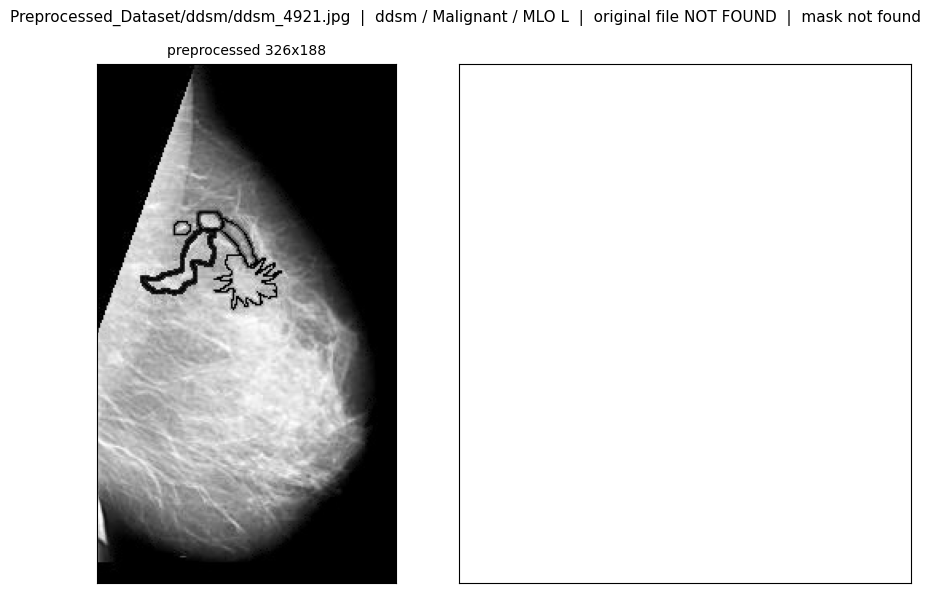

  original_source_path: mammography_dataset/cancer/case3029/LEFT_MLO.png
  The difference map says where the two files disagree. A concentrated bright outline means the marking was added after the original; diffuse low values mean re-encoding only. Neither is proof - open both files to decide.
  No unannotated version is available in this collection, so removing the marking would mean altering pixels. Not done here.

Named files are inspected here. Every image the detector flags with `annotation_overlap` is recorded in the manifest and listed in review_required.csv / the QA report - none of them is modified.


In [ ]:
# Named images, plus everything the crop detector flagged as having a marker overlapping
# tissue. Nothing here is inpainted, erased or repaired - the point is to see whether a
# marking is in the original file or was added by the earlier preprocessing.
flagged = df[df.rel_path.str.split('/').str[-1].isin(INSPECT_FILES)]
print(f'{len(flagged)} of {len(INSPECT_FILES)} named files matched: '
      f'{sorted(set(flagged.rel_path.str.split("/").str[-1]))}')

for r in flagged.to_dict('records'):
    prep, _, _ = decode_raw(r['image_path'])
    has_orig = ORIG_COL and os.path.exists(r.get('orig_path', ''))
    has_mask = MASK_COL and os.path.exists(r.get('mask_path_full', ''))
    n = 2 + int(has_orig) + int(has_mask)
    fig, ax = plt.subplots(1, n, figsize=(4.6 * n, 6))
    ax = np.atleast_1d(ax)
    ax[0].imshow(prep, cmap='gray')
    ax[0].set_title(f"preprocessed {prep.shape[0]}x{prep.shape[1]}", fontsize=10)
    k = 1
    if has_orig:
        orig, _, _ = decode_raw(r['orig_path'])
        ax[k].imshow(orig, cmap='gray')
        ax[k].set_title(f"original {orig.shape[0]}x{orig.shape[1]}", fontsize=10)
        k += 1
        # where do the two differ? a drawn outline shows up as a localised difference,
        # while re-encoding and rescaling show up as low-level noise everywhere.
        o = cv2.resize(to_unit(orig), (prep.shape[1], prep.shape[0]),
                       interpolation=cv2.INTER_AREA)
        d = np.abs(to_unit(prep) - o)
        ax[k].imshow(d, cmap='inferno')
        ax[k].set_title(f'|preprocessed - original|  max {d.max():.2f}  '
                        f'>0.2 in {100 * (d > 0.2).mean():.2f}% of pixels', fontsize=9)
        k += 1
    if has_mask:
        mask, _, _ = decode_raw(r['mask_path_full'])
        ax[k].imshow(mask, cmap='gray')
        ax[k].set_title(f'mask {mask.shape[0]}x{mask.shape[1]}  '
                        f'nonzero {100 * (mask > 0).mean():.2f}%', fontsize=9)
    for a in ax:
        a.set_xticks([]); a.set_yticks([])
    fig.suptitle(f"{r['rel_path']}  |  {r['source_dataset']} / {r['classification']} / "
                 f"{r['view']} {r['laterality']}  |  original file "
                 f"{'present' if has_orig else 'NOT FOUND'}  |  mask "
                 f"{'present' if has_mask else 'not found'}", fontsize=11)
    plt.tight_layout(); plt.show()
    print(f"  original_source_path: {r.get('original_source_path', '-')}")
    print('  The difference map says where the two files disagree. A concentrated bright '
          'outline means the marking was added after the original; diffuse low values '
          'mean re-encoding only. Neither is proof - open both files to decide.')
    if not has_orig:
        print('  No unannotated version is available in this collection, so removing the '
              'marking would mean altering pixels. Not done here.')

print('\nNamed files are inspected here. Every image the detector flags with '
      '`annotation_overlap` is recorded in the manifest and listed in '
      'review_required.csv / the QA report - none of them is modified.')

## 4. Preprocessing functions

Each function is defined once here and used by the preview, the full run and the
validation pass, so there is no second implementation that could drift.

### 4.1 The conservative crop

In [ ]:
def detect_breast_crop(gray01):
    """Conservative breast box on a [0,1] image. Exclusive upper bounds.

    Carried over from the training notebook after checking its behaviour (section 5
    re-runs those checks here). The background is a low percentile of THIS image rather
    than one fixed grey level, so an 8-bit JPEG and a 16-bit PNG from different sources
    are not held to the same threshold. Foreground is a small lift above that background.
    The largest component is taken as the breast only when no rival is comparable in
    size, so "brightest" is never assumed to mean "breast". Faint signal joined to the
    main region is always enclosed, whatever its size; faint signal detached from it is
    judged by area and, if there is too much, the original frame is kept. Bright, small,
    near-saturated components are flagged as probable markers or annotations - they are
    never painted out. When anything is uncertain the answer is the full frame and
    'review_required'.
    """
    h, w = gray01.shape
    out = {'box': (0, h, 0, w), 'status': 'review_required', 'reason': '',
           'threshold': None, 'faint_threshold': None, 'retained_frac': 1.0,
           'faint_outside_frac': 0.0, 'connected_faint_added': False,
           'annotation_overlap': False, 'n_annotation_like': 0, 'n_components': 0,
           'rival_ratio': 0.0, 'margin_applied': [0, 0], 'touches_edge': False}
    try:
        if h < 8 or w < 8:
            out['reason'] = 'image too small to analyse'
            return out
        bg = float(np.percentile(gray01, CROP_BG_PERCENTILE))
        bright = float(np.percentile(gray01, 99.0))
        thr = bg + max(CROP_ABS_MARGIN, CROP_REL_FRAC * max(bright - bg, 1e-6))
        faint_thr = bg + CROP_FAINT_FACTOR * (thr - bg)
        out['threshold'], out['faint_threshold'] = round(thr, 5), round(faint_thr, 5)

        mask = (gray01 > thr).astype(np.uint8)
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, np.ones((3, 3), np.uint8))
        if mask.sum() < CROP_MIN_AREA_FRAC * h * w:
            out['reason'] = 'almost no foreground above the background level'
            return out

        n, labels, stats, _ = cv2.connectedComponentsWithStats(mask, connectivity=8)
        vmax = float(gray01.max())
        comps, annot = [], []
        for i in range(1, n):
            x, y, bw, bh, area = stats[i]
            frac = area / float(h * w)
            sel = labels == i
            near_sat = float(gray01[sel].mean()) >= CROP_ANNOT_SAT * max(vmax, 1e-6)
            if near_sat and frac < CROP_ANNOT_MAX_AREA:
                annot.append((int(y), int(y + bh), int(x), int(x + bw)))
            if area < CROP_MIN_AREA_FRAC * h * w * 0.25:
                continue
            fill = area / max(bw * bh, 1)
            if bw > 0.95 * w and bh > 0.95 * h and fill < 0.30:
                continue                      # a bright rim around the picture is a frame
            comps.append({'i': i, 'x': int(x), 'y': int(y), 'w': int(bw), 'h': int(bh),
                          'area': int(area)})
        out['n_components'], out['n_annotation_like'] = len(comps), len(annot)
        if not comps:
            out['reason'] = 'no component survived the frame-border and size filters'
            return out

        comps.sort(key=lambda c: -c['area'])
        main = comps[0]
        if len(comps) > 1:
            out['rival_ratio'] = round(comps[1]['area'] / main['area'], 3)
            if out['rival_ratio'] > CROP_RIVAL_RATIO:
                out['reason'] = (f"two components of similar size ({main['area']} vs "
                                 f"{comps[1]['area']}) - cannot tell which is the breast")
                return out
        if main['area'] < CROP_MIN_AREA_FRAC * h * w:
            out['reason'] = f"largest component is only {main['area']} pixels"
            return out

        # --- tissue boundary, before any safety margin ---
        y0, y1 = main['y'], main['y'] + main['h']
        x0, x1 = main['x'], main['x'] + main['w']

        faint = (gray01 > faint_thr).astype(np.uint8)
        faint = cv2.morphologyEx(faint, cv2.MORPH_CLOSE, np.ones((3, 3), np.uint8))
        _, flab, fstats, _ = cv2.connectedComponentsWithStats(faint, connectivity=8)
        touching = set(np.unique(flab[labels == main['i']])) - {0}
        for lbl in touching:                  # connected faint tissue: always enclosed
            fx, fy, fw, fh, _ = fstats[lbl]
            if fy < y0 or fy + fh > y1 or fx < x0 or fx + fw > x1:
                out['connected_faint_added'] = True
            y0, y1 = min(y0, int(fy)), max(y1, int(fy + fh))
            x0, x1 = min(x0, int(fx)), max(x1, int(fx + fw))
        if out['connected_faint_added']:
            out['reason'] = 'boundary extended to enclose faint tissue joined to the breast'

        loose = faint.astype(bool).copy()     # faint signal NOT joined to the breast
        for lbl in touching:
            loose[flab == lbl] = False
        loose[y0:y1, x0:x1] = False
        frac = float(loose.sum()) / (h * w)
        out['faint_outside_frac'] = round(frac, 5)
        if frac > CROP_FAINT_TOL:
            out['reason'] = (f'{frac:.4f} of the image is faint signal detached from the '
                             'main region - it could be tissue, a marker or the other '
                             'breast, so the frame is kept')
            return out

        # --- safety margin, applied AFTER the tissue boundary is settled ---------------
        my = int(round(CROP_MARGIN_FRAC * (y1 - y0)))
        mx = int(round(CROP_MARGIN_FRAC * (x1 - x0)))
        y0, y1 = max(0, y0 - my), min(h, y1 + my)
        x0, x1 = max(0, x0 - mx), min(w, x1 + mx)
        out['margin_applied'] = [my, mx]
        out['touches_edge'] = bool(y0 == 0 or x0 == 0 or y1 == h or x1 == w)
        # markers or annotations overlapping the kept region: flagged, never painted over
        out['annotation_overlap'] = any(not (ay1 <= y0 or ay0 >= y1 or ax1 <= x0 or ax0 >= x1)
                                        for ay0, ay1, ax0, ax1 in annot)

        retained = (y1 - y0) * (x1 - x0) / float(h * w)
        out.update(box=(int(y0), int(y1), int(x0), int(x1)),
                   retained_frac=round(retained, 4))
        if retained >= CROP_TIGHT_FRAC:
            out['status'] = 'already_tight'
            out['reason'] = out['reason'] or 'the frame already contains little background'
        else:
            out['status'] = 'cropped'
            out['reason'] = out['reason'] or 'background margin removed'
        return out
    except Exception as exc:
        out['reason'] = f'crop detection failed: {type(exc).__name__}: {exc}'
        return out

def crop_box(raw):
    """Detector on a downsampled copy when the image is large; box mapped back to the
    ORIGINAL grid and rounded OUTWARD, so the mapping can only ever keep more tissue."""
    g = to_unit(raw)
    h, w = g.shape
    f = min(1.0, CROP_DETECT_MAX_SIDE / float(max(h, w)))
    if f >= 1.0:
        info = detect_breast_crop(g)
        info['detect_scale'] = 1.0
        return info
    small = cv2.resize(g, (max(1, int(round(w * f))), max(1, int(round(h * f)))),
                       interpolation=cv2.INTER_AREA)
    info = detect_breast_crop(small)
    sy, sx = h / float(small.shape[0]), w / float(small.shape[1])
    y0, y1, x0, x1 = info['box']
    info['box'] = (max(0, int(math.floor(y0 * sy))), min(h, int(math.ceil(y1 * sy))),
                   max(0, int(math.floor(x0 * sx))), min(w, int(math.ceil(x1 * sx))))
    info['detect_scale'] = round(f, 4)
    info['retained_frac'] = round((info['box'][1] - info['box'][0]) *
                                  (info['box'][3] - info['box'][2]) / float(h * w), 4)
    return info

### 4.2 Masters, 8-bit conversion, resize, padding and CLAHE

The master is the cropped original pixels at the original depth: no resize, no CLAHE, no
padding, no sharpening - so other input resolutions can be produced from it later.

Both training variants come from the same master and the same single resize. Scale is
`min(target_h / crop_h, target_w / crop_w)`, area interpolation when shrinking and
bilinear when enlarging, then centred black padding to exactly 1520x912. CLAHE is applied
to the resized, unpadded 8-bit crop and then padded identically, so cropping, intensity
conversion and image membership are the same in both variants and only CLAHE differs.

Normalisation by a model's mean and standard deviation is not done here - that belongs in
the training data loader.

In [ ]:
PNG_OK = {np.dtype('uint8'), np.dtype('uint16')}      # what PNG can store losslessly

def save_png(path, arr):
    if arr.dtype not in PNG_OK:
        raise RuntimeError(f'dtype {arr.dtype} is not a PNG grayscale format - handled '
                           'explicitly rather than cast silently')
    ok, buf = cv2.imencode('.png', arr, [cv2.IMWRITE_PNG_COMPRESSION, 6])
    if not ok:
        raise RuntimeError(f'PNG encode failed for {path}')
    write_atomic(path, lambda tmp: open(tmp, 'wb').write(buf.tobytes()))
    return hashlib.sha256(buf.tobytes()).hexdigest()[:32]

def to_8bit(arr, policy):
    """One documented conversion, applied identically to both variants."""
    if arr.dtype == np.uint8:
        return arr, {'kind': 'identity', 'container': 255, 'scale': 1.0}
    if policy.get('kind') != 'linear_container' or not policy.get('confirmed'):
        raise RuntimeError('bit-depth container not established from training images - '
                           'flagged rather than converted by invention')
    c = policy['container']
    out = np.clip(arr.astype(np.float32) * (255.0 / c), 0, 255).round().astype(np.uint8)
    return out, {'kind': 'linear_container', 'container': int(c),
                 'scale': round(255.0 / c, 8)}

def resize_once(img8):
    """Proportional resize to fit inside the target. Returns the UNPADDED image."""
    h, w = img8.shape
    s = min(TARGET_H / float(h), TARGET_W / float(w))
    nh = min(TARGET_H, max(1, int(round(h * s))))
    nw = min(TARGET_W, max(1, int(round(w * s))))
    interp = cv2.INTER_AREA if s < 1 else cv2.INTER_LINEAR
    return cv2.resize(img8, (nw, nh), interpolation=interp), s, nh, nw, \
        ('area' if s < 1 else 'linear')

def pad_to_target(img8, nh, nw):
    top = (TARGET_H - nh) // 2
    left = (TARGET_W - nw) // 2
    bottom, right = TARGET_H - nh - top, TARGET_W - nw - left
    out = cv2.copyMakeBorder(img8, top, bottom, left, right, cv2.BORDER_CONSTANT, value=0)
    assert out.shape == (TARGET_H, TARGET_W), out.shape
    return out, dict(pad_top=top, pad_bottom=bottom, pad_left=left, pad_right=right)

_clahe = cv2.createCLAHE(clipLimit=CLAHE_CLIP, tileGridSize=CLAHE_GRID)
def apply_clahe(img8):
    # tileGridSize is the NUMBER OF TILES across the image (8 x 8 of them), not 8-pixel
    # tiles, so the tile size scales with the image.
    return _clahe.apply(img8)

REL = {'master': 'masters', 'baseline': 'baseline', 'clahe': f'clahe_{str(CLAHE_CLIP).replace(".","p")}_grid{CLAHE_GRID[0]}'}
VARIANT_NAME = REL['clahe']

def process_one(row, out_dir=None):
    """decode -> detect -> crop original pixels -> master; then one resize shared by
    both variants -> baseline / CLAHE -> identical padding.

    `row` may be a dict or a pandas Series; it is converted to a dict and read by key.
    Attribute access is not safe here: on a Series, `row.view` returns the Series.view
    METHOD rather than the view column, and `itertuples` silently renames any column
    whose name contains a space.
    """
    row = dict(row)
    out_dir = out_dir or OUT_DIR
    rec = {'image_id': row['image_id'], 'source_dataset': row['source_dataset'],
           'rel_path': row['rel_path'], 'patient': row['patient'], 'split': row['split'],
           'role': row['role'], 'classification': row['classification'],
           'label_text': row['label_text'], 'view': row['view'], 'laterality': row['laterality'],
           'modality': row['modality'], 'acquisition': row['acquisition'],
           'eligible': bool(row['eligible']),
           'acquisition_evidence': row.get('acquisition_evidence', ''),
           'status': 'failed', 'reason': '',
           'flip_ops': '[]', 'orientation_status': 'unresolved_stored_retained',
           'prep_version': PREP_VERSION, 'config_hash': CONFIG_HASH,
           'master_path': '', 'baseline_path': '', 'clahe_path': '',
           'master_sha': '', 'baseline_sha': '', 'clahe_sha': ''}
    try:
        raw, ch, note = decode_raw(row['image_path'])
        rec.update(channels=ch, channel_note=note, dtype=str(raw.dtype),
                   orig_h=int(raw.shape[0]), orig_w=int(raw.shape[1]))
        info = crop_box(raw)
        y0, y1, x0, x1 = info['box']
        assert 0 <= y0 < y1 <= raw.shape[0] and 0 <= x0 < x1 <= raw.shape[1], info['box']
        crop = raw[y0:y1, x0:x1]              # ORIGINAL stored values, nothing masked
        rec.update(crop_y0=y0, crop_y1=y1, crop_x0=x0, crop_x1=x1,
                   crop_h=int(crop.shape[0]), crop_w=int(crop.shape[1]),
                   crop_status=info['status'], crop_reason=info['reason'],
                   crop_threshold=info['threshold'], detect_scale=info['detect_scale'],
                   retained_frac=info['retained_frac'],
                   crop_area_frac=round(crop.size / float(raw.size), 4),
                   faint_outside_frac=info['faint_outside_frac'],
                   connected_faint_added=info['connected_faint_added'],
                   annotation_overlap=info['annotation_overlap'],
                   n_annotation_like=info['n_annotation_like'],
                   n_components=info['n_components'], rival_ratio=info['rival_ratio'],
                   touches_edge=info['touches_edge'],
                   crop_margin_applied=str(info['margin_applied']))

        stem = f"{row['source_dataset']}/{row['image_id']}"
        if MAKE_MASTERS:
            p = f'{out_dir}/{REL["master"]}/{stem}.png'
            rec['master_sha'] = save_png(p, crop)      # no resize, no CLAHE, no padding
            rec['master_path'] = os.path.relpath(p, out_dir)

        pol = BITDEPTH_POLICY.get('%s|%s' % (row['source_dataset'], raw.dtype), {})
        img8, conv = to_8bit(crop, pol)
        rec.update(to8_kind=conv['kind'], to8_container=conv['container'],
                   to8_scale=conv['scale'])

        resized, scale, nh, nw, interp = resize_once(img8)
        rec.update(resize_scale=round(float(scale), 6), resized_h=nh, resized_w=nw,
                   interpolation=interp,
                   enlargement_factor=round(float(max(scale, 0.0)), 6),
                   pad_frac=round(1.0 - (nh * nw) / float(TARGET_H * TARGET_W), 4))

        if MAKE_BASELINE:
            base, pads = pad_to_target(resized, nh, nw)
            rec.update(pads)
            p = f'{out_dir}/{REL["baseline"]}/{stem}.png'
            rec['baseline_sha'] = save_png(p, base)
            rec['baseline_path'] = os.path.relpath(p, out_dir)
        if MAKE_CLAHE:
            cl, pads = pad_to_target(apply_clahe(resized), nh, nw)
            rec.update(pads)
            p = f'{out_dir}/{REL["clahe"]}/{stem}.png'
            rec['clahe_sha'] = save_png(p, cl)
            rec['clahe_path'] = os.path.relpath(p, out_dir)

        rec['status'] = ('review_required' if info['status'] == 'review_required'
                         else 'processed')
        rec['reason'] = info['reason']
    except Exception as exc:
        rec['reason'] = f'{type(exc).__name__}: {exc}'
    return rec

## 5. Training-only preview and checks

### 5.1 Targeted checks

In [ ]:
# Targeted checks on constructed cases. A failure here stops the notebook: these are the
# properties everything downstream assumes. Passing them shows the LOGIC behaves as
# described - it does not show that real breast tissue is preserved. Only the preview
# below, on real training images, can speak to that.
FAIL = []
def check(name, cond, detail=''):
    print(f'  {"PASS" if cond else "FAIL"}  {name}{"  " + detail if detail else ""}')
    if not cond:
        FAIL.append(name)

def synth(h=200, w=150, bg=0.02):
    return np.full((h, w), bg, np.float32)
def blob(im, y, x, bh, bw, v=0.60):
    im = im.copy(); im[y:y + bh, x:x + bw] = v; return im

base = blob(synth(), 60, 60, 80, 50)
bgv = float(np.percentile(base, CROP_BG_PERCENTILE))
thr = bgv + max(CROP_ABS_MARGIN, CROP_REL_FRAC * (float(np.percentile(base, 99.0)) - bgv))
faint_thr = bgv + CROP_FAINT_FACTOR * (thr - bgv)
between = (thr + faint_thr) / 2.0    # invisible to the main mask, visible to the faint one

print('crop logic')
check('blank image is flagged, not cropped',
      detect_breast_crop(synth())['status'] == 'review_required')
for tag, (ey, ex, eh, ew) in (('large', (70, 20, 60, 40)), ('small', (95, 52, 8, 8))):
    im = base.copy(); im[ey:ey + eh, ex:ex + ew] = between
    r = detect_breast_crop(im); y0, y1, x0, x1 = r['box']
    frac = (eh * ew) / float(im.size)
    check(f'faint tissue joined to the breast is kept ({tag}, {frac:.4f} of frame)',
          y0 <= ey and x0 <= ex and y1 >= ey + eh and x1 >= ex + ew,
          f'box {r["box"]} status {r["status"]}')
im = base.copy(); im[70:130, 20:60] = between
r = detect_breast_crop(im)
check('safety margin survives the expansion', r['box'][2] < 20 or r['box'][2] == 0,
      f'x0 {r["box"][2]} vs extension at 20, margin {r["margin_applied"]}')
im = blob(synth(), 60, 80, 80, 50); im[10:40, 5:35] = between
check('detached faint signal keeps the original frame',
      detect_breast_crop(im)['status'] == 'review_required')
im = blob(synth(), 60, 60, 80, 50); im[5:12, 5:40] = 1.0        # bright text top-left
r = detect_breast_crop(im)
check('disconnected bright component is noticed',
      r['status'] == 'review_required' or r['n_annotation_like'] > 0,
      f"status {r['status']}, annotation-like {r['n_annotation_like']}")
r = detect_breast_crop(blob(synth(), 0, 20, 200, 50))           # tissue runs off the top
#                                    ^ spans the full height, so the box must reach y=0
check('tissue touching the image edge is handled and flagged',
      r['status'] != 'review_required' and r['touches_edge'], f"box {r['box']}")
r = detect_breast_crop(blob(blob(synth(), 20, 20, 60, 50), 120, 80, 60, 50))
check('two comparable components are flagged', r['status'] == 'review_required')

print('decoding')
tmpd = tempfile.mkdtemp()
a8 = (np.arange(256, dtype=np.uint8).reshape(16, 16))
cv2.imwrite(f'{tmpd}/a8.png', a8)
d8, _, _ = decode_raw(f'{tmpd}/a8.png')
check('8-bit PNG round-trips exactly', d8.dtype == np.uint8 and np.array_equal(d8, a8))
a16 = (np.linspace(0, 4095, 256).astype(np.uint16).reshape(16, 16))   # 12-bit in 16-bit
cv2.imwrite(f'{tmpd}/a16.png', a16)
d16, _, _ = decode_raw(f'{tmpd}/a16.png')
check('16-bit PNG keeps its stored depth and values',
      d16.dtype == np.uint16 and np.array_equal(d16, a16), f'max {d16.max()} of 65535')
conv_ok = to_8bit(d16, {'kind': 'linear_container', 'confirmed': True, 'container': 4095})
check('a 12-bit container maps to the full 8-bit range, not 1/16 of it',
      conv_ok[0].max() == 255, f'max {conv_ok[0].max()}')
try:
    to_8bit(d16, {'kind': 'unclear', 'confirmed': False})
    check('unclear encoding refuses to convert', False)
except RuntimeError:
    check('unclear encoding refuses to convert', True)
rgb = np.stack([a8, a8, a8], -1); cv2.imwrite(f'{tmpd}/rgb.png', rgb)
check('identical RGB reduces to one channel', decode_raw(f'{tmpd}/rgb.png')[0].ndim == 2)
col = np.stack([a8, a8[::-1], a8], -1); cv2.imwrite(f'{tmpd}/col.png', col)
try:
    decode_raw(f'{tmpd}/col.png'); check('genuinely coloured image is refused', False)
except RuntimeError:
    check('genuinely coloured image is refused', True)

print('geometry')
geom_ok, shape_ok, pad_ok = True, True, True
for (h, w) in [(1, 1), (7, 5000), (5000, 7), (359, 207), (6000, 4748), (1520, 912),
               (3040, 1824), (193, 84), (2000, 1200)]:
    img = np.zeros((h, w), np.uint8)
    rs, s, nh, nw, _ = resize_once(img)
    out, pads = pad_to_target(rs, nh, nw)
    geom_ok &= abs(s - min(TARGET_H / h, TARGET_W / w)) < 1e-9 and nh >= 1 and nw >= 1 \
        and nh <= TARGET_H and nw <= TARGET_W
    shape_ok &= out.shape == (TARGET_H, TARGET_W)
    pad_ok &= (pads['pad_top'] + nh + pads['pad_bottom'] == TARGET_H
               and pads['pad_left'] + nw + pads['pad_right'] == TARGET_W)
check('scale is min(H/h, W/w), dimensions clamped and non-zero', geom_ok)
check('every output is exactly %dx%d' % (TARGET_H, TARGET_W), shape_ok)
check('recorded padding reconstructs the target on all four sides', pad_ok)

big = np.zeros((2400, 1600), np.float32) + 0.02      # forces detection on a downsample
big[700:1900, 400:1100] = 0.6
info = crop_box((big * 255).astype(np.uint8))
y0, y1, x0, x1 = info['box']
check('a box found on a downsample maps back and still contains the region',
      info['detect_scale'] < 1.0 and y0 <= 700 and x0 <= 400 and y1 >= 1900 and x1 >= 1100,
      f'detect_scale {info["detect_scale"]} box {info["box"]}')

if FAIL:
    raise SystemExit('SAFETY OR GEOMETRY CHECKS FAILED: %s - not processing anything.'
                     % FAIL)
print('\nall checks passed')

crop logic
  PASS  blank image is flagged, not cropped
  PASS  faint tissue joined to the breast is kept (large, 0.0800 of frame)  box (58, 142, 17, 113) status cropped
  PASS  faint tissue joined to the breast is kept (small, 0.0021 of frame)  box (58, 142, 50, 112) status cropped
  PASS  safety margin survives the expansion  x0 17 vs extension at 20, margin [2, 3]
  PASS  detached faint signal keeps the original frame
  PASS  disconnected bright component is noticed  status review_required, annotation-like 1
  PASS  tissue touching the image edge is handled and flagged  box (0, 200, 18, 72)
  PASS  two comparable components are flagged
decoding
  PASS  8-bit PNG round-trips exactly
  PASS  16-bit PNG keeps its stored depth and values  max 4095 of 65535
  PASS  a 12-bit container maps to the full 8-bit range, not 1/16 of it  max 255
  PASS  unclear encoding refuses to convert
  PASS  identical RGB reduces to one channel
  PASS  genuinely coloured image is refused
geometry
  PASS  scal

### 5.2 Preview on training images

Every source, the available classes and views, the smallest and largest images, the
narrowest and widest crops, the faintest boundaries, the largest enlargements, the
heaviest padding, and the review cases.

Titles are short - source, id, view, dimensions, scale, padding, status - and the full
record for every preview case goes to `preview_records.csv`. Baseline and CLAHE are drawn
on the same fixed display range so the plot cannot manufacture a difference between them.
The left and right boundary strips are shown rotated a quarter turn, since a tall narrow
strip renders as an unreadable sliver.

crop survey (train):   0%|          | 0/400 [00:00<?, ?it/s]

status
cropped            260
already_tight      137
review_required      3

retained area  median 0.949  [0.064, 1.000]
resize scale   median 4.14x  (57% of training images are ENLARGED)
padding        median 0.243  max 0.602
flagged: 0 with an overlapping marker, 391 touching an edge, 274 extended for connected faint tissue

preview cases: 23


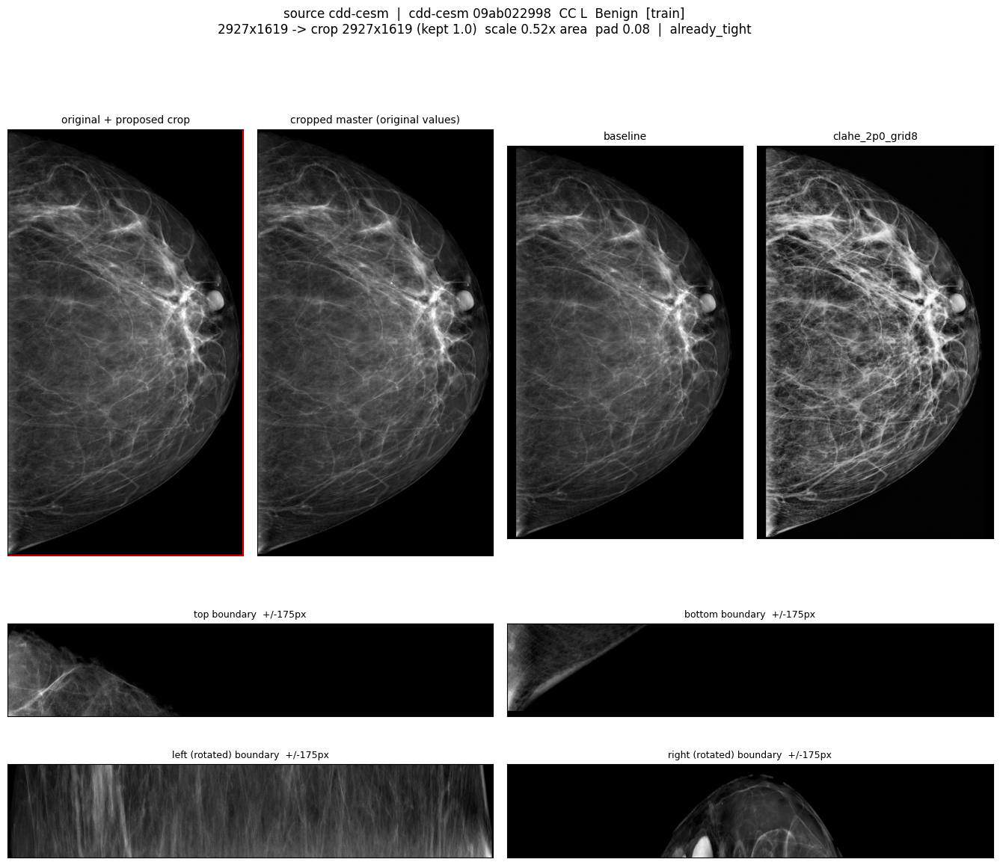

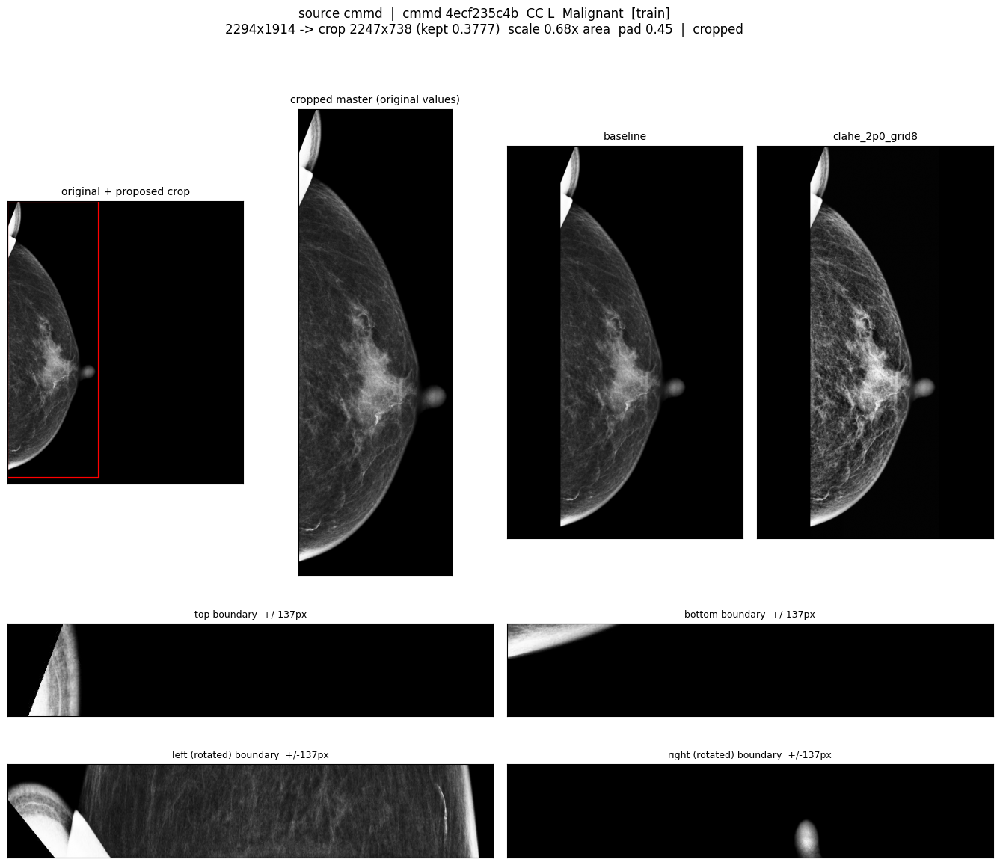

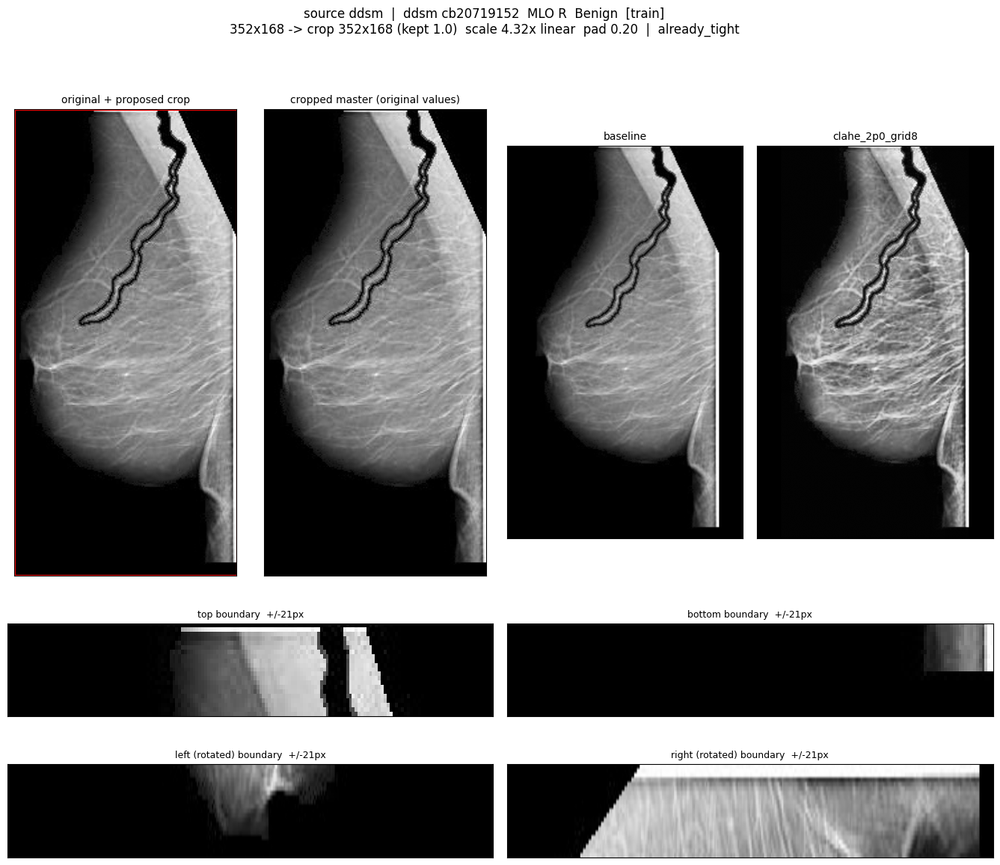

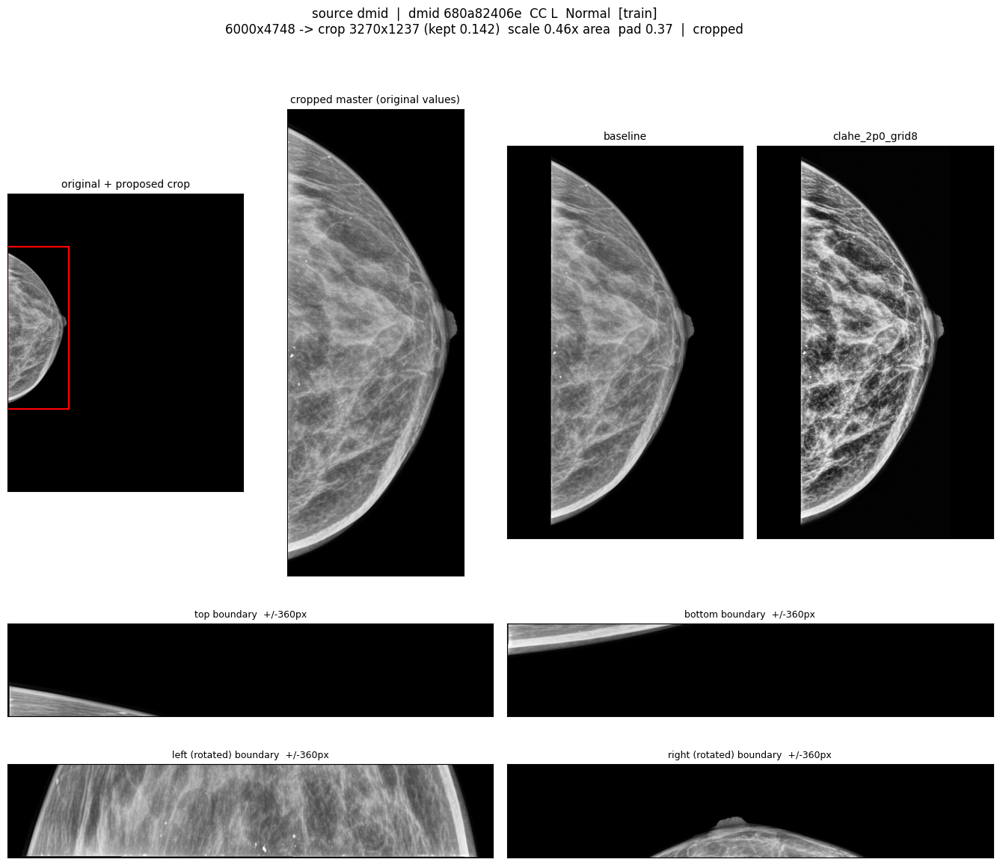

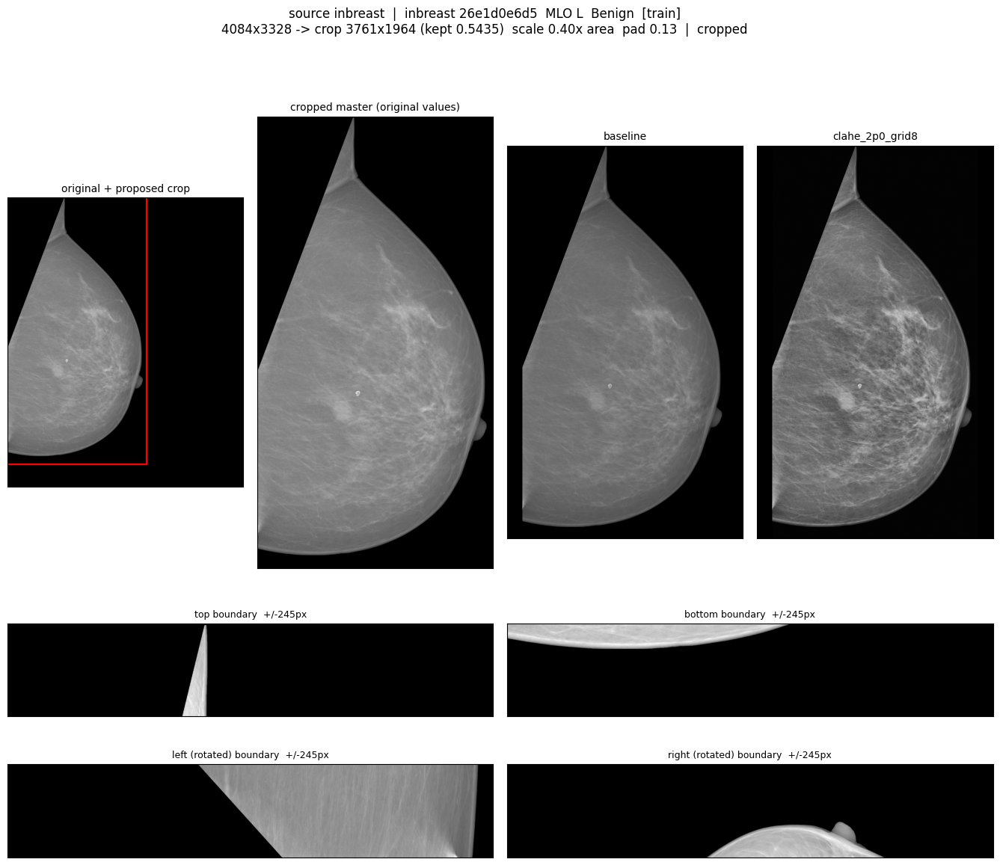

...

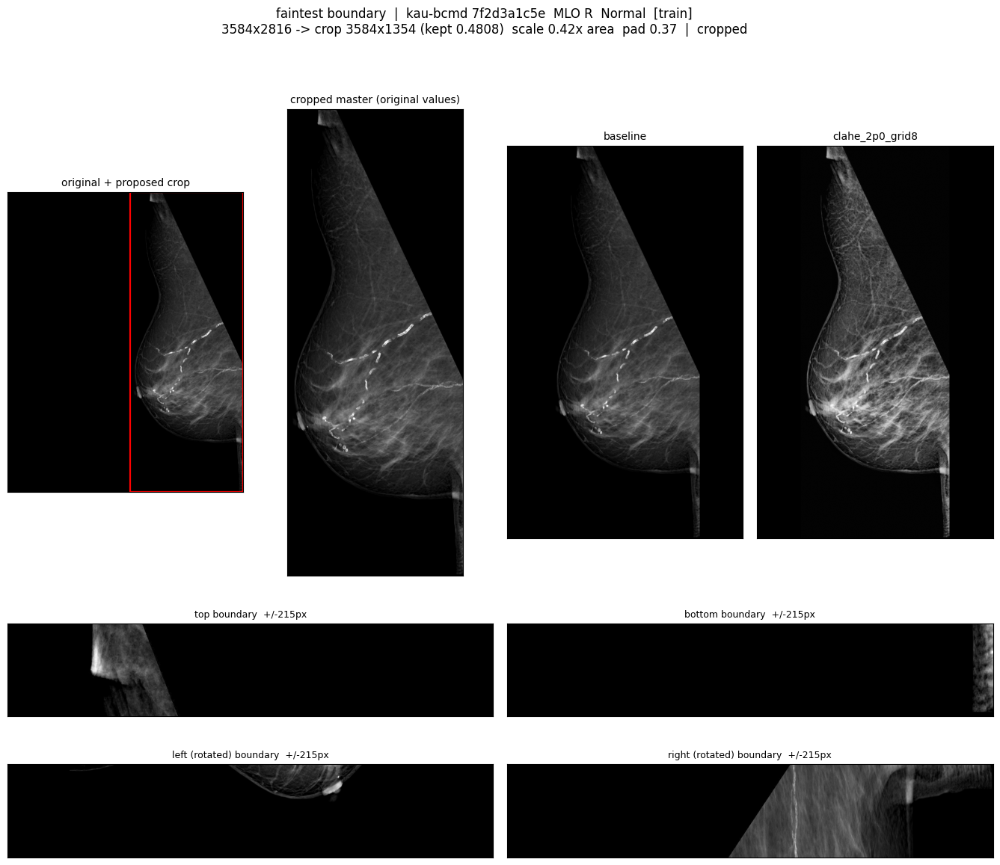

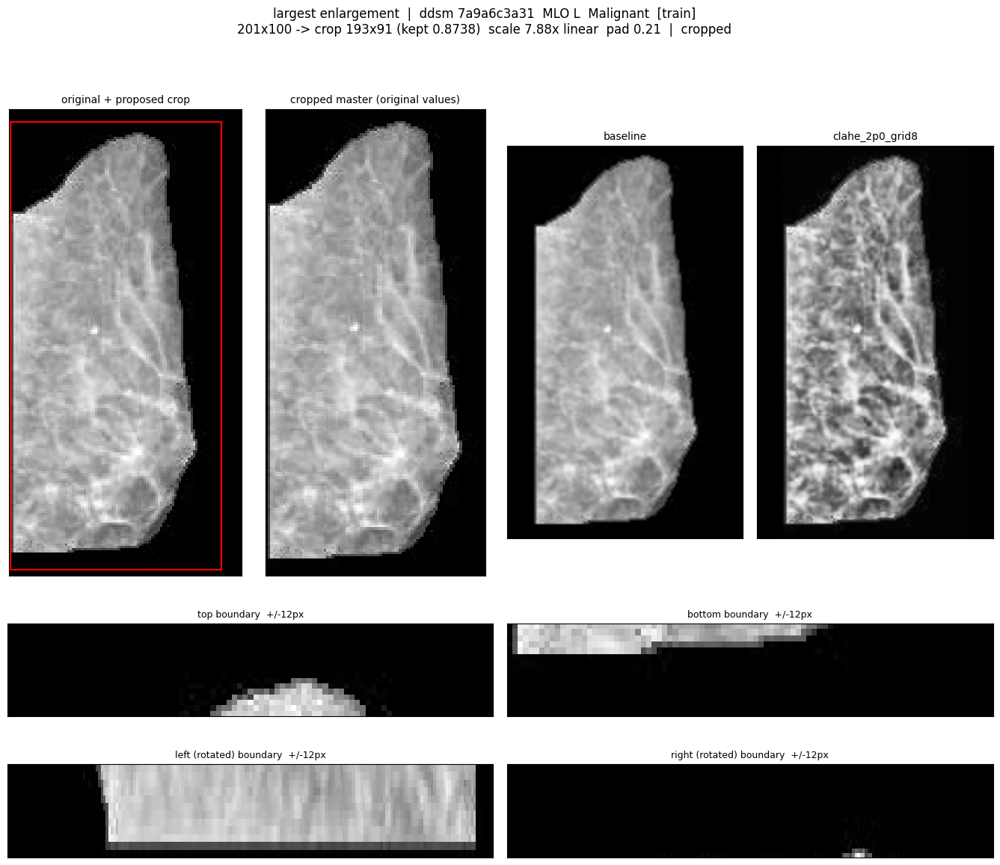

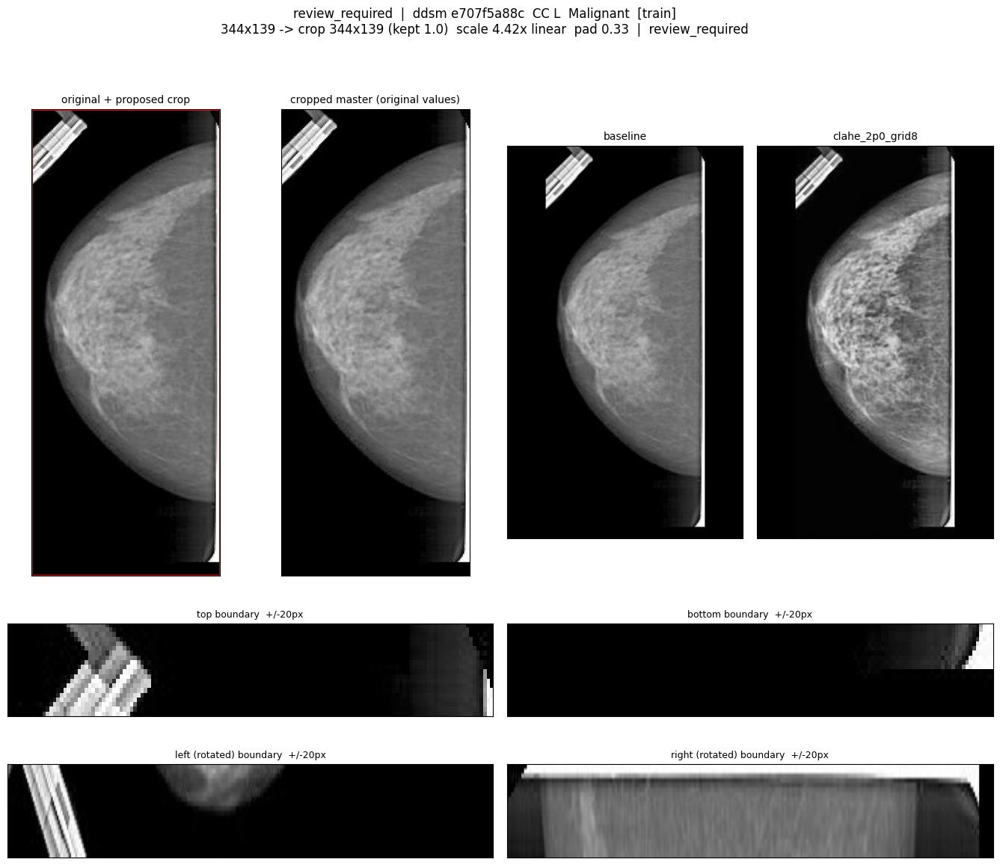

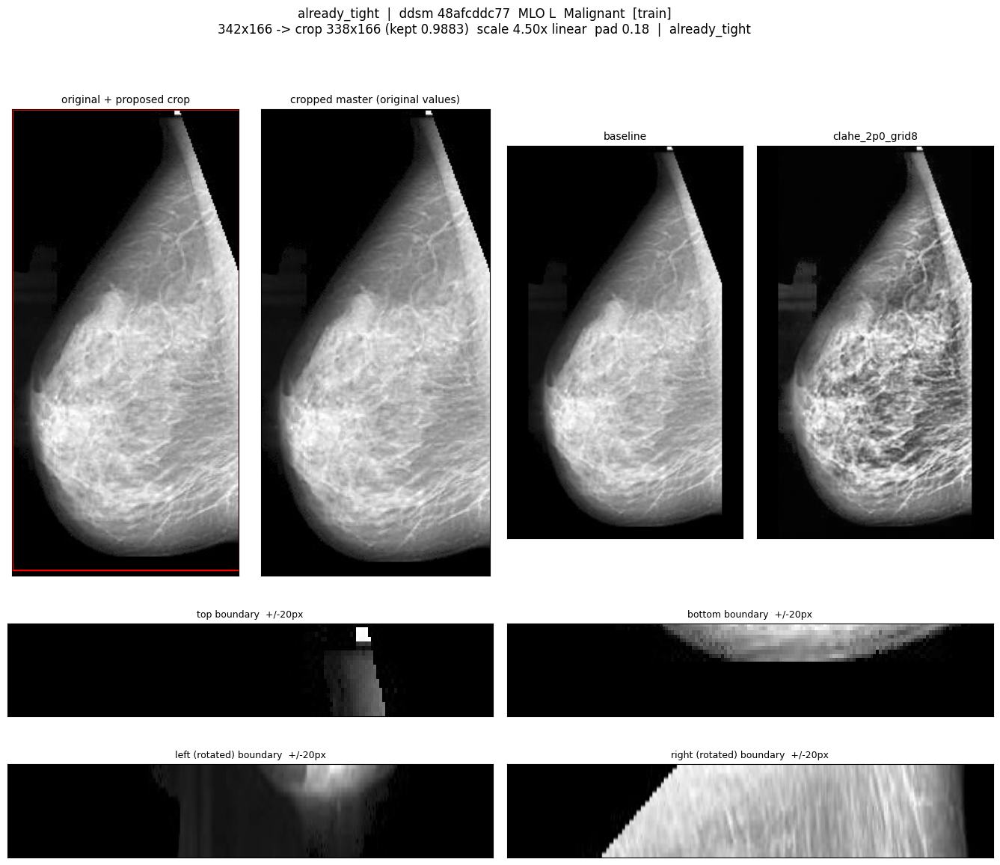

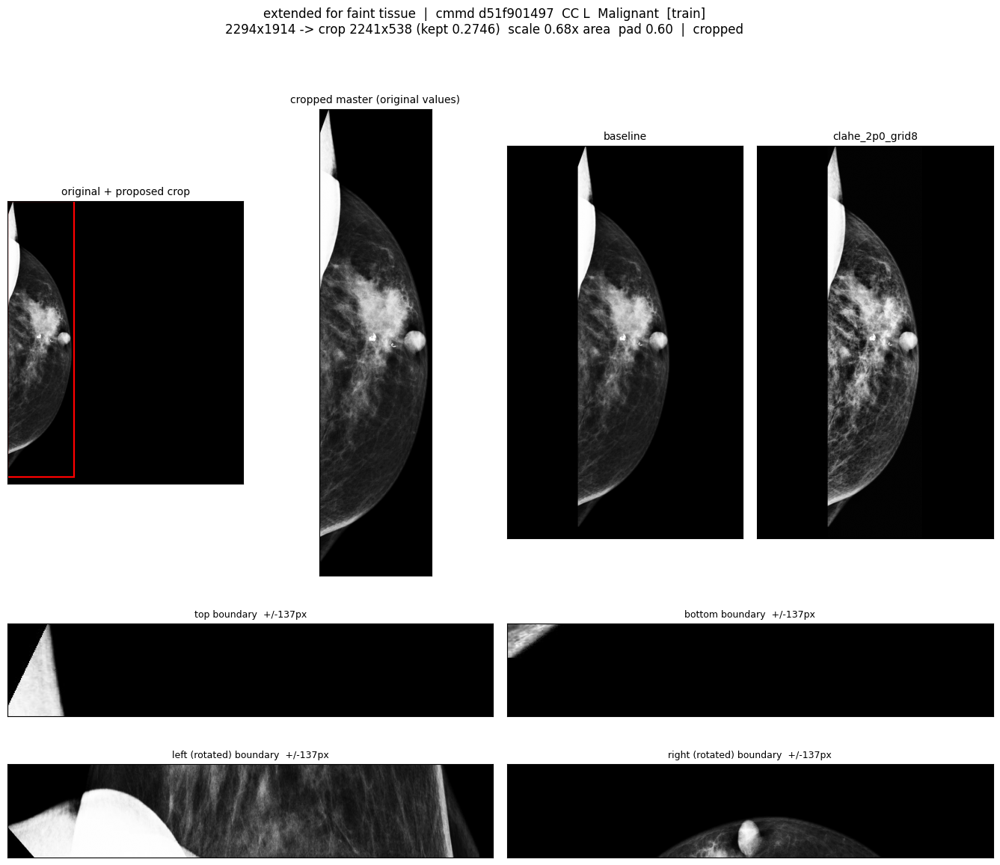

full preview metadata -> /content/mammo_preprocess/reports/preview_records.csv
Look at the boundary close-ups: any breast tissue cut at an edge means CROP_MARGIN_FRAC is too small or the case belongs in review_required. These are 23 training images out of 11784. They show what the code does on the cases picked; they do not establish that tissue is preserved across the collection. The 3% margin is a starting point, not evidence that the crop is safe.


In [ ]:
# TRAINING IMAGES ONLY. Crop settings are inspected and adjusted here; validation, test
# and unassigned images are never looked at, so no held-out image or label can influence
# the configuration. Once this preview looks right, the configuration is frozen and the
# same code runs over everything.
pool = df[(df.split == 'train') & df.image_id.isin(
    audit[audit.decode_status == 'ok'].image_id)]
if not len(pool):
    raise SystemExit('no decodable training images - check the split manifest path')
SURVEY_N = min(400, len(pool))
survey = pool.sample(SURVEY_N, random_state=SEED)

def measure(row):
    raw, _, _ = decode_raw(row['image_path'])
    info = crop_box(raw)
    y0, y1, x0, x1 = info['box']
    ch, cw = y1 - y0, x1 - x0
    s = min(TARGET_H / float(ch), TARGET_W / float(cw))
    nh, nw = min(TARGET_H, max(1, round(ch * s))), min(TARGET_W, max(1, round(cw * s)))
    bg = float(np.percentile(to_unit(raw), CROP_BG_PERCENTILE))
    return {'image_id': row['image_id'], 'status': info['status'],
            'retained': info['retained_frac'], 'scale': s,
            'pad_frac': 1 - (nh * nw) / float(TARGET_H * TARGET_W),
            'aspect': cw / float(ch), 'area': raw.size,
            'contrast': float(np.percentile(to_unit(raw), 99) - bg),
            'annot': info['annotation_overlap'], 'edge': info['touches_edge'],
            'faint_added': info['connected_faint_added']}

with ThreadPoolExecutor(N_WORKERS) as ex:
    m = pd.DataFrame(list(tqdm(ex.map(measure, survey.to_dict('records')),
                               total=SURVEY_N, desc='crop survey (train)')))
m = m.merge(df[['image_id', 'source_dataset', 'classification', 'view', 'image_path',
                'acquisition']], on='image_id')
print(m.status.value_counts().to_string())
print(f"\nretained area  median {m.retained.median():.3f}  "
      f"[{m.retained.min():.3f}, {m.retained.max():.3f}]")
print(f"resize scale   median {m.scale.median():.2f}x  "
      f"({int((m.scale > 1).mean() * 100)}% of training images are ENLARGED)")
print(f"padding        median {m.pad_frac.median():.3f}  max {m.pad_frac.max():.3f}")
print(f"flagged: {int(m.annot.sum())} with an overlapping marker, {int(m.edge.sum())} "
      f"touching an edge, {int(m.faint_added.sum())} extended for connected faint tissue")
m.to_csv(f'{REPORT_DIR}/train_crop_survey.csv', index=False)

# a reproducible spread rather than the first N rows
picks, why = [], {}
def take(label, sub):
    for i in sub.image_id.tolist():
        if i not in picks:
            picks.append(i); why[i] = label; return
for s in sorted(m.source_dataset.unique()):
    take(f'source {s}', m[m.source_dataset == s])
for c in sorted(m.classification.dropna().unique()):
    take(f'class {c}', m[m.classification == c])
for v in sorted(m.view.dropna().astype(str).unique())[:3]:
    take(f'view {v}', m[m.view.astype(str) == v])
for a in sorted(m.acquisition.unique()):
    take(f'acquisition {a}', m[m.acquisition == a])
take('smallest image', m.nsmallest(1, 'area'))
take('largest image', m.nlargest(1, 'area'))
take('narrowest crop', m.nsmallest(1, 'aspect'))
take('widest crop', m.nlargest(1, 'aspect'))
take('faintest boundary', m.nsmallest(1, 'contrast'))
take('largest enlargement', m.nlargest(1, 'scale'))
take('most padding', m.nlargest(1, 'pad_frac'))
take('review_required', m[m.status == 'review_required'])
take('already_tight', m[m.status == 'already_tight'])
take('marker overlapping tissue', m[m.annot])
take('extended for faint tissue', m[m.faint_added])
print(f'\npreview cases: {len(picks)}')

prev_dir = f'{LOCAL_ROOT}/preview'
shutil.rmtree(prev_dir, ignore_errors=True)
prev_records = []
for iid in picks:
    r = df[df.image_id == iid].to_dict('records')[0]     # dict, never a Series
    rec = process_one(r, out_dir=prev_dir)
    prev_records.append({**rec, 'preview_reason': why[iid]})
    raw, _, _ = decode_raw(r['image_path'])
    if rec['status'] == 'failed':
        print(f"{why[iid]}: FAILED - {rec['reason']}")
        continue
    y0, y1, x0, x1 = rec['crop_y0'], rec['crop_y1'], rec['crop_x0'], rec['crop_x1']
    master = raw[y0:y1, x0:x1]
    base = cv2.imread(f"{prev_dir}/{rec['baseline_path']}", cv2.IMREAD_UNCHANGED)
    cla = cv2.imread(f"{prev_dir}/{rec['clahe_path']}", cv2.IMREAD_UNCHANGED)

    fig = plt.figure(figsize=(17, 13))
    gs = fig.add_gridspec(3, 4, height_ratios=[5, 1, 1], hspace=0.22, wspace=0.06)
    fig.suptitle(
        f"{why[iid]}  |  {r['source_dataset']} {rec['image_id'][:10]}  "
        f"{r['view']} {r['laterality']}  {r['classification']}  [{r['split']}]\n"
        f"{rec['orig_h']}x{rec['orig_w']} -> crop {rec['crop_h']}x{rec['crop_w']} "
        f"(kept {rec['retained_frac']})  scale {rec['resize_scale']:.2f}x "
        f"{rec['interpolation']}  pad {rec['pad_frac']:.2f}  |  {rec['crop_status']}"
        + ('  MARKER OVERLAPS TISSUE' if rec['annotation_overlap'] else ''),
        fontsize=12, y=0.985)
    for col, (img, name, kw) in enumerate([
            (raw, 'original + proposed crop', {}),
            (master, 'cropped master (original values)', {}),
            (base, 'baseline', dict(vmin=0, vmax=255)),
            (cla, VARIANT_NAME, dict(vmin=0, vmax=255))]):
        a = fig.add_subplot(gs[0, col])
        a.imshow(img, cmap='gray', **kw)      # one display range for both variants
        a.set_title(name, fontsize=10)
        a.set_xticks([]); a.set_yticks([])
        if col == 0:
            a.add_patch(Rectangle((x0, y0), x1 - x0, y1 - y0, fill=False, ec='red', lw=1.6))
    # boundary close-ups. The left and right strips are tall and narrow, so they are
    # shown rotated a quarter turn - otherwise they render as unreadable slivers.
    b = max(8, int(0.06 * max(raw.shape)))
    strips = [('top', raw[max(0, y0 - b):min(raw.shape[0], y0 + b), x0:x1], False),
              ('bottom', raw[max(0, y1 - b):min(raw.shape[0], y1 + b), x0:x1], False),
              ('left (rotated)', raw[y0:y1, max(0, x0 - b):min(raw.shape[1], x0 + b)], True),
              ('right (rotated)', raw[y0:y1, max(0, x1 - b):min(raw.shape[1], x1 + b)], True)]
    for k, (name, strip, rot) in enumerate(strips):
        a = fig.add_subplot(gs[1 + k // 2, (k % 2) * 2:(k % 2) * 2 + 2])
        a.imshow(np.rot90(strip) if rot else strip, cmap='gray', aspect='auto')
        a.set_title(f'{name} boundary  +/-{b}px', fontsize=9)
        a.set_xticks([]); a.set_yticks([])
    plt.show()

pd.DataFrame(prev_records).to_csv(f'{REPORT_DIR}/preview_records.csv', index=False)
print(f'full preview metadata -> {REPORT_DIR}/preview_records.csv')
print('Look at the boundary close-ups: any breast tissue cut at an edge means '
      'CROP_MARGIN_FRAC is too small or the case belongs in review_required. These are '
      f'{len(picks)} training images out of {len(pool)}. They show what the code does on '
      'the cases picked; they do not establish that tissue is preserved across the '
      'collection. The 3% margin is a starting point, not evidence that the crop is safe.')

### 5.3 Preview stop

In [ ]:
if PREVIEW_ONLY:
    raise SystemExit(
        'PREVIEW ONLY - stopping here, before full processing and export.\n'
        f'Reviewed {len(picks)} training cases from a {SURVEY_N}-image survey; nothing '
        'outside the training partition was opened.\n\n'
        'To run the whole collection:\n'
        '  1. Check the boundary close-ups above and the review_required cases.\n'
        '  2. Adjust CROP_MARGIN_FRAC or the crop settings in section 1 if needed, and '
        're-run sections 1, 4 and 5.\n'
        '  3. Set PREVIEW_ONLY = False in section 1 and run the notebook from the top.\n\n'
        'The full run has no image-count limit: every eligible row in the manifest is '
        'processed.')

## 6. Complete dataset processing

Every eligible row, bounded thread parallelism, atomic writes, and a partial manifest
appended as it goes so an interrupted run can resume - but only when the archive hash and
the configuration hash both match the previous run.

In [ ]:
# Every eligible row. No head(), no sample, no cap.
work = df[df.eligible].copy()
skipped = df[~df.eligible].copy()
print(f'{len(work)} eligible rows to process ({len(skipped)} set aside at the label '
      f'stage and carried into the ledger, not dropped)')

# Resume only when the input and the configuration are the same as last time.
state_path = f'{LOCAL_ROOT}/.processing.json'
done = {}
prev_state = json.load(open(state_path)) if os.path.exists(state_path) else None
part_path = f'{REPORT_DIR}/manifest_partial.jsonl'
if prev_state and prev_state.get('input_id') == INPUT_ID and os.path.exists(part_path):
    for line in open(part_path):
        try:
            r = json.loads(line); done[r['image_id']] = r
        except json.JSONDecodeError:
            pass                        # a torn last line from an interrupted run
    print(f'resuming: {len(done)} rows already done under the same archive and config')
elif prev_state:
    print('previous run used a different archive or configuration - starting over')
    for d in (OUT_DIR,):
        shutil.rmtree(d, ignore_errors=True); os.makedirs(d, exist_ok=True)
    if os.path.exists(part_path):
        os.remove(part_path)
json.dump({'input_id': INPUT_ID, 'started': time.strftime('%Y-%m-%d %H:%M:%S')},
          open(state_path, 'w'), indent=2)

todo = [r for r in work.to_dict('records') if r['image_id'] not in done]
records, t0 = list(done.values()), time.time()
lock_file = open(part_path, 'a')
with ThreadPoolExecutor(N_WORKERS) as ex:
    futures = {ex.submit(process_one, r): r['image_id'] for r in todo}
    for fut in tqdm(as_completed(futures), total=len(futures), desc='processing'):
        rec = fut.result()
        records.append(rec)
        lock_file.write(json.dumps(rec, default=str) + '\n')
        lock_file.flush()
lock_file.close()
print(f'{len(todo)} images in {time.time() - t0:.0f}s '
      f'({len(todo) / max(time.time() - t0, 1):.1f}/s, {N_WORKERS} workers)')

manifest = pd.DataFrame(records)
# every set-aside row is carried through so the ledger reconciles against the input
if len(skipped):
    manifest = pd.concat([manifest, skipped.assign(
        status='not_eligible', reason='label not in ' + str(CLASSES),
        prep_version=PREP_VERSION, config_hash=CONFIG_HASH)[
            ['image_id', 'source_dataset', 'rel_path', 'patient', 'split', 'role',
             'classification', 'label_text', 'view', 'laterality', 'modality',
             'acquisition', 'status', 'reason', 'prep_version', 'config_hash']]],
        ignore_index=True)
manifest['label'] = manifest.label_text.map({c: i for i, c in enumerate(CLASSES)})
manifest.to_csv(f'{REPORT_DIR}/manifest.csv', index=False)

ledger = manifest.status.value_counts().to_dict()
print('\n' + pd.Series(ledger).to_string())
assert len(manifest) == len(df), (
    f'{len(manifest)} manifest rows against {len(df)} input rows - every input row must '
    'be accounted for as processed, retained with a review flag, or failed')
failed = manifest[manifest.status == 'failed']
review = manifest[manifest.status == 'review_required']
failed.to_csv(f'{REPORT_DIR}/failures.csv', index=False)
review.to_csv(f'{REPORT_DIR}/review_required.csv', index=False)
print(f'\nfailures -> {REPORT_DIR}/failures.csv ({len(failed)})')
print(f'review   -> {REPORT_DIR}/review_required.csv ({len(review)}) - these kept their '
      'full original frame')
if len(failed):
    print(failed.reason.value_counts().head(10).to_string())
proc = manifest[manifest.status.isin(['processed', 'review_required'])]
print()
print(pd.crosstab(proc.source_dataset, proc.status).to_string())

19496 eligible rows to process (235 set aside at the label stage and carried into the ledger, not dropped)


processing:   0%|          | 0/19496 [00:00<?, ?it/s]

19496 images in 5480s (3.6/s, 2 workers)

processed          19459
not_eligible         235
review_required       36
failed                 1

failures -> /content/mammo_preprocess/reports/failures.csv (1)
review   -> /content/mammo_preprocess/reports/review_required.csv (36) - these kept their full original frame
reason
error: OpenCV(5.0.0) /io/opencv/modules/core/src/matrix.cpp:1259: error: (-215:Assertion failed) 0 <= roi.x && 0 <= roi.width && roi.x + roi.width <= m.cols && 0 <= roi.y && 0 <= roi.height && roi.y + roi.height <= m.rows in function 'Mat'\n    1

status          processed  review_required
source_dataset                            
cdd-cesm             1001                2
cmmd                 5196                5
ddsm                10371               29
dmid                  390                0
inbreast              367                0
kau-bcmd             2134                0


## 7. Output validation

Every generated file is reopened. Masters are compared pixel by pixel against the source
image cropped with the recorded coordinates, which is what makes the crop coordinates in
the manifest trustworthy rather than merely recorded.

In [ ]:
good = manifest[manifest.status.isin(['processed', 'review_required'])]

def validate_one(r):
    r = dict(r)
    p = {'image_id': r['image_id'], 'ok': True, 'problems': []}
    def bad(msg):
        p['ok'] = False; p['problems'].append(msg)
    for kind, col, exp_shape in (('baseline', 'baseline_path', (TARGET_H, TARGET_W)),
                                 ('clahe', 'clahe_path', (TARGET_H, TARGET_W)),
                                 ('master', 'master_path', None)):
        rel = r.get(col, '') or ''
        if not rel:
            continue
        f = f'{OUT_DIR}/{rel}'
        a = cv2.imread(f, cv2.IMREAD_UNCHANGED)
        if a is None:
            bad(f'{kind}: will not reopen'); continue
        if exp_shape and a.shape != exp_shape:
            bad(f'{kind}: shape {a.shape} not {exp_shape}')
        if exp_shape and a.dtype != np.uint8:
            bad(f'{kind}: dtype {a.dtype} not uint8')
        if kind == 'master':
            src, _, _ = decode_raw(f"{IMG_ROOT}/{r['rel_path']}")
            want = src[int(r['crop_y0']):int(r['crop_y1']), int(r['crop_x0']):int(r['crop_x1'])]
            if a.dtype != want.dtype:
                bad(f'master: dtype {a.dtype} not {want.dtype}')
            elif a.shape != want.shape:
                bad(f'master: shape {a.shape} not {want.shape}')
            elif not np.array_equal(a, want):
                bad('master: pixels differ from the cropped source')
        if a.dtype == np.uint8 and exp_shape:
            nh, nw = int(r['resized_h']), int(r['resized_w'])
            t, l = int(r['pad_top']), int(r['pad_left'])
            border = a.copy(); border[t:t + nh, l:l + nw] = 0
            if border.any():
                bad(f'{kind}: padding is not black outside the recorded window')
    # aspect ratio must survive the resize: no variant is tightened to reduce padding
    if r.get('resized_h'):
        want_ar = r['crop_w'] / float(r['crop_h'])
        got_ar = r['resized_w'] / float(r['resized_h'])
        if abs(want_ar - got_ar) > 2.0 / min(r['resized_h'], r['resized_w']):
            bad(f"aspect ratio changed: crop {want_ar:.4f} -> resized {got_ar:.4f}")
    return p

with ThreadPoolExecutor(N_WORKERS) as ex:
    checks = pd.DataFrame(list(tqdm(ex.map(validate_one, good.to_dict('records')),
                                    total=len(good), desc='validate')))
n_bad = int((~checks.ok).sum())
checks[~checks.ok].to_csv(f'{REPORT_DIR}/validation_problems.csv', index=False)
print(f'reopened and checked {len(checks)} rows | problems {n_bad}')
if n_bad:
    for x in checks[~checks.ok].problems.head(10):
        print('   ', x)
assert n_bad == 0, f'{n_bad} generated files failed validation - see the CSV above'

# the two variants must cover exactly the same images
b_ids = set(good[good.baseline_path.astype(bool)].image_id)
c_ids = set(good[good.clahe_path.astype(bool)].image_id)
if MAKE_BASELINE and MAKE_CLAHE:
    assert b_ids == c_ids, (f'variant membership differs: baseline only {len(b_ids - c_ids)}, '
                            f'clahe only {len(c_ids - b_ids)}')
    print(f'baseline and {VARIANT_NAME} cover the same {len(b_ids)} image ids')

# reconciliation: every input row, in exactly one outcome
recon = manifest.status.value_counts()
assert recon.sum() == len(df) == len(meta), 'manifest does not reconcile with metadata.csv'
print(f'\nreconciled {len(meta)} metadata rows -> {recon.to_dict()}')

QA = {
    'prep_version': PREP_VERSION, 'config_hash': CONFIG_HASH, 'input_id': INPUT_ID,
    'when': time.strftime('%Y-%m-%d %H:%M:%S'), 'packages': PKG_VERSIONS,
    'config': CONFIG, 'bitdepth_policy': BITDEPTH_POLICY, 'orientation': ORIENTATION,
    'counts': {'metadata_rows': int(len(meta)), **{k: int(v) for k, v in recon.items()}},
    'by_source': pd.crosstab(good.source_dataset, good.status).to_dict(),
    'by_class': good.label_text.value_counts(dropna=False).to_dict(),
    'by_split': good.split.value_counts().to_dict(),
    'by_role': good.role.value_counts().to_dict(),
    'by_acquisition': good.acquisition.value_counts().to_dict(),
    'review_reasons': manifest[manifest.status == 'review_required'].crop_reason
                      .str.slice(0, 60).value_counts().head(15).to_dict(),
    'failure_reasons': manifest[manifest.status == 'failed'].reason
                       .str.slice(0, 60).value_counts().head(15).to_dict(),
    'resize_scale': {k: float(v) for k, v in good.resize_scale.describe().items()},
    'enlarged_fraction': float((good.resize_scale > 1).mean()),
    'pad_frac': {k: float(v) for k, v in good.pad_frac.describe().items()},
    'crop_area_frac': {k: float(v) for k, v in good.crop_area_frac.describe().items()},
    'annotation_overlap': int(good.annotation_overlap.sum()),
    'touching_edge': int(good.touches_edge.sum()),
    'duplicate_content_across_splits': int(len(dupes)),
    'validation_problems': n_bad,
}
json.dump(QA, open(f'{REPORT_DIR}/qa_report.json', 'w'), indent=2, default=str)
json.dump(CONFIG, open(f'{REPORT_DIR}/config.json', 'w'), indent=2)
print(json.dumps({k: QA[k] for k in ('counts', 'by_class', 'by_split', 'by_acquisition',
                                     'enlarged_fraction', 'annotation_overlap',
                                     'touching_edge', 'duplicate_content_across_splits')},
                 indent=2, default=str))
print(f"\n{QA['counts'].get('review_required', 0)} images are RETAINED WITH A REVIEW FLAG. "
      'They kept their full original frame and have not been checked by anyone. They are '
      'validated as files, not as crops.')

validate:   0%|          | 0/19495 [00:00<?, ?it/s]

reopened and checked 19495 rows | problems 0
baseline and clahe_2p0_grid8 cover the same 19495 image ids

reconciled 19731 metadata rows -> {'processed': 19459, 'not_eligible': 235, 'review_required': 36, 'failed': 1}
{
  "counts": {
    "metadata_rows": 19731,
    "processed": 19459,
    "not_eligible": 235,
    "review_required": 36,
    "failed": 1
  },
  "by_class": {
    "Malignant": 8183,
    "Benign": 6069,
    "Normal": 5243
  },
  "by_split": {
    "train": 11648,
    "test": 2944,
    "val": 2943,
    "selection": 1960
  },
  "by_acquisition": {
    "standard": 18492,
    "cdd_low_energy": 1003
  },
  "enlarged_fraction": 0.5693254680687355,
  "annotation_overlap": 0,
  "touching_edge": 19190,
  "duplicate_content_across_splits": 12
}

36 images are RETAINED WITH A REVIEW FLAG. They kept their full original frame and have not been checked by anyone. They are validated as files, not as crops.


## 8. Packaging and Drive export

### 8.1 Package locally and index the checksums

In [ ]:
# Package locally first: real image files plus the manifests and reports, split into
# archives small enough to copy and verify one at a time.
SHARD_BYTES = 3 * 1024 ** 3

def add_shards(name, root):
    """Tar the tree under root into name_00.tar shards. Returns the archive paths."""
    if not os.path.isdir(root):
        return []
    files = sorted(os.path.join(r, f) for r, _, fs in os.walk(root) for f in fs)
    shards, cur, size, idx = [], [], 0, 0
    for f in files:
        s = os.path.getsize(f)
        if cur and size + s > SHARD_BYTES:
            shards.append((idx, cur)); cur, size, idx = [], 0, idx + 1
        cur.append(f); size += s
    if cur:
        shards.append((idx, cur))
    out = []
    for idx, group in shards:
        p = f'{PACK_DIR}/{name}_{idx:02d}.tar'
        def build(tmp, group=group):
            with tarfile.open(tmp, 'w') as tf:
                for f in group:
                    tf.add(f, arcname=os.path.relpath(f, LOCAL_ROOT))
        write_atomic(p, build)
        out.append(p)
        print(f'  {os.path.basename(p)}  {len(group)} files  '
              f'{os.path.getsize(p) / 1e9:.2f} GB')
    return out

shutil.rmtree(PACK_DIR, ignore_errors=True); os.makedirs(PACK_DIR, exist_ok=True)
packages = []
for name, sub in (('masters', REL['master']), ('baseline', REL['baseline']),
                  (VARIANT_NAME, REL['clahe'])):
    d = f'{OUT_DIR}/{sub}'
    if os.path.isdir(d):
        print(f'{name}:')
        packages += add_shards(name, d)
print('reports:')
packages += add_shards('reports', REPORT_DIR)

index = {os.path.basename(p): {'sha256': sha256_file(p), 'bytes': os.path.getsize(p)}
         for p in tqdm(packages, desc='checksum')}
write_atomic(f'{PACK_DIR}/SHA256SUMS.json',
             lambda t: open(t, 'w').write(json.dumps(index, indent=2)))
write_atomic(f'{PACK_DIR}/SHA256SUMS.txt',
             lambda t: open(t, 'w').write(
                 ''.join(f"{v['sha256']}  {k}\n" for k, v in sorted(index.items()))))
print(f'\n{len(packages)} archives, {sum(v["bytes"] for v in index.values())/1e9:.2f} GB '
      f'total, checksum index written')

masters:
  masters_00.tar  3819 files  3.23 GB
  masters_01.tar  13311 files  3.24 GB
  masters_02.tar  2366 files  2.67 GB
baseline:
  baseline_00.tar  10667 files  3.24 GB
  baseline_01.tar  8829 files  2.38 GB
clahe_2p0_grid8:
  clahe_2p0_grid8_00.tar  8202 files  3.24 GB
  clahe_2p0_grid8_01.tar  9760 files  3.24 GB
  clahe_2p0_grid8_02.tar  1533 files  0.68 GB
reports:
  reports_00.tar  13 files  0.06 GB


checksum:   0%|          | 0/9 [00:00<?, ?it/s]


9 archives, 21.98 GB total, checksum index written


### 8.2 Copy to Drive and verify the destination

In [ ]:
# Only now does anything touch Drive, and only a NEW versioned folder. The source
# archive and the original collection are never written to.
assert not os.path.exists(f'{DRIVE_EXPORT}/COMPLETE.json'), (
    f'{DRIVE_EXPORT} already holds a completed export. Bump PREP_VERSION rather than '
    'overwriting it.')
os.makedirs(DRIVE_EXPORT, exist_ok=True)

for src in tqdm([f'{PACK_DIR}/{n}' for n in sorted(index)] +
                [f'{PACK_DIR}/SHA256SUMS.json', f'{PACK_DIR}/SHA256SUMS.txt'],
                desc='copy to Drive'):
    dst = f'{DRIVE_EXPORT}/{os.path.basename(src)}'
    if os.path.exists(dst) and os.path.getsize(dst) == os.path.getsize(src):
        continue
    shutil.copyfile(src, dst)

# verify the DESTINATION copies, not the local ones
bad = []
for name, meta_ in tqdm(sorted(index.items()), desc='verify on Drive'):
    dst = f'{DRIVE_EXPORT}/{name}'
    if not os.path.exists(dst):
        bad.append((name, 'missing')); continue
    if os.path.getsize(dst) != meta_['bytes']:
        bad.append((name, 'size differs')); continue
    if sha256_file(dst) != meta_['sha256']:
        bad.append((name, 'checksum differs'))
if bad:
    raise SystemExit(f'destination verification failed: {bad}\nLocal outputs under '
                     f'{LOCAL_ROOT} are untouched - fix the copy and re-run this cell.')
print(f'all {len(index)} archives verified on Drive by SHA-256')

COMPLETE = {
    'prep_version': PREP_VERSION, 'config_hash': CONFIG_HASH, 'input_id': INPUT_ID,
    'when': time.strftime('%Y-%m-%d %H:%M:%S'), 'packages': index,
    'images_processed': int(QA['counts'].get('processed', 0)),
    'images_review_required': int(QA['counts'].get('review_required', 0)),
    'images_failed': int(QA['counts'].get('failed', 0)),
    'not_eligible': int(QA['counts'].get('not_eligible', 0)),
    'export_status': 'verified',
    'training_readiness': 'NOT ESTABLISHED - export completion means the files copied '
                          'and their checksums match. It says nothing about whether the '
                          'crops are correct. The review_required cases are unresolved.',
}
json.dump(COMPLETE, open(f'{DRIVE_EXPORT}/COMPLETE.json', 'w'), indent=2)
print(f'\nexport complete -> {DRIVE_EXPORT}')
print(f"processed {COMPLETE['images_processed']} | review {COMPLETE['images_review_required']}"
      f" | failed {COMPLETE['images_failed']} | not eligible {COMPLETE['not_eligible']}")
print(f'\nLocal outputs under {LOCAL_ROOT} are kept. Delete them only now that the Drive '
      'copy is verified, and only if you need the space.')
print(COMPLETE['training_readiness'])

copy to Drive:   0%|          | 0/11 [00:00<?, ?it/s]

verify on Drive:   0%|          | 0/9 [00:00<?, ?it/s]

all 9 archives verified on Drive by SHA-256

export complete -> /content/drive/MyDrive/mamobench-dataset/preprocessed_prep-v1
processed 19459 | review 36 | failed 1 | not eligible 235

Local outputs under /content/mammo_preprocess are kept. Delete them only now that the Drive copy is verified, and only if you need the space.
NOT ESTABLISHED - export completion means the files copied and their checksums match. It says nothing about whether the crops are correct. The review_required cases are unresolved.


## What this does and does not establish

This notebook prepares a baseline and a CLAHE candidate. Visual appearance and histogram
similarity cannot establish which produces better cancer classification. That decision
requires matched training and validation experiments using the same patient splits.

This is a **Mammo-FM-informed** preprocessing workflow. It does not reproduce the
published pipeline exactly: the conservative crop and the aspect-ratio-preserving padding
to 1520x912 are our own design choices, made so that two variants can be compared under
identical geometry.

Two things worth keeping in view when the results come in. Most training images are
**enlarged** to reach the target - section 5 prints the fraction - and enlarging a
low-resolution picture does not restore anatomical detail that was not captured. And
images marked `review_required` kept their original frame and have not been looked at by
anyone; the export being verified means the files copied intact, not that the crops are
correct.